# **Correlation analysis of the sensitivity values**

## Navigation

- [**Basic imports and initialization**](#Basic-imports-and-initialization)
- [**1. Alexnet**](#1.-Alexnet)
- [**2. ResNet18**](#2.-ResNet18)

## Basic imports and initialization

$\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#1.-Alexnet)

- [Limiting the hardware resources, importing packages](#Limiting-the-hardware-resources,-importing-packages)
- [Initializing common variables](#Initializing-common-variables)

### Limiting the hardware resources, importing packages

$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$[[Next subsect.$\to$]](#Initializing-common-variables)

To provide easy access to modules stored in the ```../src/``` directory, we use the following workaround:

In [1]:
import sys
sys.path.append('../src/')

Next, we limit the hardware usage:

In [2]:
# set limitations on hardware
import hardware_setup
hardware_setup.mkl_set_num_threads(num_threads=1)

[mkl]: set up num_threads=1/24


Then we import all necessary packages:

In [3]:
import os
import functools

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import correlation.su_visualize
import correlation.su_compute

import sensitivity_analysis.preprocess_visualize
import sensitivity_analysis.augmentation_setting

import preparation.single_unit
import preparation.utils

### Initializing common variables

[[$\leftarrow$Prev.subsect.]](#Limiting-the-hardware-resources,-importing-packages)$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$

In [4]:
#data_dirname = '../data/imagenet'
su_activations_dirname = '../results/single_unit/'
activations_dirname = '../results'

#model_dirname = '../torch-models/'
#exp_relative_path = '../experiments/'

su_values_fnm_base = 'imagenet_ILSVRC_values_selected_single_units'
values_fnm_base = 'imagenet_ILSVRC_values'
augmentation_set_numbers_list = [1, 2]

extract_auxilliary_names = True

no_chan_name = 'original'

In [5]:
shpv_group_indices_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    shpv_group_indices_dict[
        augmentation_set_number
    ] = sensitivity_analysis.augmentation_setting.get_group_variables_indices(
        augmentation_set_number,
        use_permutation_variable=extract_auxilliary_names,
        use_class_variable=extract_auxilliary_names,
        use_partition_variable=extract_auxilliary_names
    )

    
values_names_dict = {
    'shpv': ['shpv'],
    'si': ['si', 'siT'],
}
ncols_orig = 8

chans_name_list = list(preparation.single_unit._HSVG_channel_names)
value_name_list = functools.reduce(
    lambda x, y: x+y, values_names_dict.values()
)

In [6]:
#corr_type = 'pearson'
#corr_type = 'spearman'

show = True
# plot_colorbar = True

#figsize_uw_means_cm_1 = (12, 12)
#figsize_uw_means_cm_2 = (14, 12)
figsize_uw_means_cm_1 = (10.5, 10.5)
figsize_uw_means_cm_2 = (10.5*7/6, 10.5)
figsize_hist_uw_means_cm = (12, 8)
figsize_corr_consolidated = (14, 10)
figsize_uw_means_diff_cm_1 = (10, 10)
figsize_uw_means_diff_cm_2 = (12, 10)
figsize_hist_uw_means_diff_cm = (12, 8)
figsize_corr_consolidated_diff = (14, 8)
#figsize_unit_cm_patterns = (7, 7)
figsize_unit_cm_patterns = (7, 5)
figsize_hist_uw_means_diff_cm_norm = (12, 8)
#figsize_uw_means_diff_cm_norm_orig_chan = (8, 8)
figsize_uw_means_diff_cm_norm_orig_chan = (8, 6)
figsize_hist_uw_means_diff_cm_norm_orig_chan = (12, 8)

cmap_uw_means_cm = 'RdBu_r'
color_cumul_uw_means_cm = 'burlywood'
color_bins_uw_means_cm = 'firebrick'
cmap_corr_consolidated = 'twilight'
cmap_uw_means_diff_cm = 'coolwarm'
color_cumul_uw_means_diff_cm = 'rosybrown'
color_bins_uw_means_diff_cm = 'firebrick'
cmap_unit_cm_patterns = 'bone_r'
color_cumul_hist_uw_means_diff_cm_norm = 'slategray'
color_bins_hist_uw_means_diff_cm_norm = 'firebrick'
cmap_uw_means_diff_cm_norm_orig_chan = 'gist_yarg'
color_cumul_hist_uw_means_diff_cm_norm_orig_chan = 'dimgray'
color_bins_hist_uw_means_diff_cm_norm_orig_chan = 'firebrick'

## 1. Alexnet

[[$\leftarrow$ Prev.part]](#Basic-imports-and-initialization) $\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#2.-ResNet18)


- [1.1 Setting up the configuration variables](#1.1-Setting-up-the-configuration-variables)
- [1.2 Correlation (space-wise) between pairs of augmentation variables](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)
- [1.3 Mean absolute differences between (space-wise) correlation matrices (original and cut submodule)](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))
- [1.4 Mean absolute norm between (space-wise) correlation matrices for pairs of layers](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)
- [1.5 Correlation patterns extracted from correlation matrices for paired layers](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)
- [1.6 Mean absolute norm between (space-wise) original-channel differences of correlation matrices for pairs of layers](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)
- [1.7 Correlation patterns extracted from original-channel correlation matrices for paired layers](#1.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

### 1.1 Setting up the configuration variables

$\quad$ [[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)


In [7]:
alexnet_network_name = 'alexnet'
alexnet_network_modules = [
    'features.2', # Conv2d + ReLU + MaxPool2d
    'features.5', # ... + Conv2d + ReLU + MaxPool2d
    'features.7', # ... + Conv2d + ReLU
    'features.9', # ... + Conv2d + ReLU
    #'features.12', # ... + Conv2d + ReLU + MaxPool2d
    'avgpool', # ... + Conv2d + ReLU + MaxPool2d + AdaptiveAvgPool
    'classifier.2', # ... + Linear + ReLU
    'classifier.5', # ... + Linear + ReLU
    'classifier.6', # ... + Linear
]
alexnet_n_conv_modules = len(
    list(filter(lambda x: ('features' in x) or ('avgpool' in x), alexnet_network_modules))
)

alexnet_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    alexnet_network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

alexnet_hsv_values_fnms_dict = preparation.single_unit.extract_channeled_single_units_values_fnms(
    alexnet_network_name,
    su_values_fnm_base,
    augmentation_set_numbers_list,
    channels=preparation.single_unit._HSVG_channel_names,
)

alexnet_json_config_path = f'./{alexnet_network_name}_single_units.json'
alexnet_analysis_config_list = preparation.single_unit.load_config_from_json(alexnet_json_config_path)
alexnet_analysis_config_list = preparation.single_unit.extract_neuron_indices(alexnet_analysis_config_list)

In [8]:
alexnet_results_hsv, alexnet_results_orig = preparation.utils.get_original_and_channeled_values(
    alexnet_hsv_values_fnms_dict,
    su_activations_dirname,
    alexnet_values_fnms_dict,
    activations_dirname,
    alexnet_analysis_config_list,
    alexnet_network_modules,
    values_names_dict,
    augmentation_set_numbers_list,
    shpv_group_indices_dict,
    extract_auxilliary_names=extract_auxilliary_names,
)

In [9]:
alexnet_mean_cormat_hsv_dict = {}
alexnet_std_cormat_hsv_dict = {}
alexnet_nanmask_cormat_hsv_dict = {}
alexnet_mean_cormat_orig_dict = {}
alexnet_std_cormat_orig_dict = {}
alexnet_nanmask_cormat_orig_dict = {}
alexnet_mean_cormat_diff = {}
alexnet_std_cormat_diff = {}
alexnet_nanmask_cormat_diff = {}

for augmentation_set_number in augmentation_set_numbers_list:
    (
        (mean_cormat_hsv, std_cormat_hsv, nanmask_cormat_hsv),
        (mean_cormat_orig, std_cormat_orig, nanmask_cormat_orig),
        (mean_cormat_diff, std_cormat_diff, nanmask_cormat_diff),
    ) = correlation.su_compute.extract_unit_mean_pixelwise_correlation_patterns(
        alexnet_results_hsv,
        alexnet_results_orig,
        alexnet_network_modules,
        augmentation_set_number,
        chans_name_list,
        value_name_list,
        extract_auxilliary_names=extract_auxilliary_names,
        nan_mask_policy='all',
    )
    alexnet_mean_cormat_hsv_dict[augmentation_set_number] = mean_cormat_hsv
    alexnet_std_cormat_hsv_dict[augmentation_set_number] = std_cormat_hsv
    alexnet_nanmask_cormat_hsv_dict[augmentation_set_number] = nanmask_cormat_hsv
    alexnet_mean_cormat_orig_dict[augmentation_set_number] = mean_cormat_orig
    alexnet_std_cormat_orig_dict[augmentation_set_number] = std_cormat_orig
    alexnet_nanmask_cormat_orig_dict[augmentation_set_number] = nanmask_cormat_orig
    alexnet_mean_cormat_diff[augmentation_set_number] = mean_cormat_diff
    alexnet_std_cormat_diff[augmentation_set_number] = std_cormat_diff
    alexnet_nanmask_cormat_diff[augmentation_set_number] = nanmask_cormat_diff

In [10]:
alexnet_cm_mean_hsv_diff_dict = {}
alexnet_cm_std_hsv_diff_dict = {}
alexnet_cm_corr_hsv_diff_dict = {}
alexnet_cm_corr_hsv_diff_nanmask_dict = {}
alexnet_cm_mean_hsv_orig_diff_dict = {}
alexnet_cm_std_hsv_orig_diff_dict = {}
alexnet_cm_corr_hsv_orig_diff_dict = {}
alexnet_cm_corr_hsv_orig_diff_nanmask_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    (
        (
            alexnet_cm_mean_hsv_diff,
            alexnet_cm_std_hsv_diff,
            alexnet_cm_corr_hsv_diff,
            alexnet_cm_corr_hsv_diff_nanmask,
        ),
        (
            alexnet_cm_mean_hsv_orig_diff,
            alexnet_cm_std_hsv_orig_diff,
            alexnet_cm_corr_hsv_orig_diff,
            alexnet_cm_corr_hsv_orig_diff_nanmask,
        ),
    ) = correlation.su_compute.extract_hsv_correlation_layerwise_diff_patterns(
        alexnet_mean_cormat_hsv_dict[augmentation_set_number],
        alexnet_mean_cormat_orig_dict[augmentation_set_number],
        alexnet_network_modules[:alexnet_n_conv_modules],
        augmentation_set_number,
        chans_name_list,
        value_name_list,
        extract_auxilliary_names=extract_auxilliary_names,
    )
    alexnet_cm_mean_hsv_diff_dict[augmentation_set_number] = alexnet_cm_mean_hsv_diff
    alexnet_cm_std_hsv_diff_dict[augmentation_set_number] = alexnet_cm_std_hsv_diff
    alexnet_cm_corr_hsv_diff_dict[augmentation_set_number] = alexnet_cm_corr_hsv_diff
    alexnet_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number] = alexnet_cm_corr_hsv_diff_nanmask
    alexnet_cm_mean_hsv_orig_diff_dict[augmentation_set_number] = alexnet_cm_mean_hsv_orig_diff
    alexnet_cm_std_hsv_orig_diff_dict[augmentation_set_number] = alexnet_cm_std_hsv_orig_diff
    alexnet_cm_corr_hsv_orig_diff_dict[augmentation_set_number] = alexnet_cm_corr_hsv_orig_diff
    alexnet_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number] = alexnet_cm_corr_hsv_orig_diff_nanmask

### 1.2 Correlation (space-wise) between pairs of augmentation variables

[[$\leftarrow$Prev.subsect.]](#1.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

- [1.2.1 Unit-wise means](#1.2.1-Unit-wise-means)
- [1.2.2 Histograms of the (unit-wise) standard deviations](#1.2.2-Histograms-of-the-(unit-wise)-standard-deviations)
- [1.2.3 Consolidated summary plots](#1.2.3-Consolidated-summary-plots)

### 1.2.1 Unit-wise means

- [1.2.1.1 Augmentation set 1](#1.2.1.2-Augmentation-set-1)
- [1.2.1.2 Augmentation set 2](#1.2.1.2-Augmentation-set-2)

[[Back to subsection]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 1.2.1.1 Augmentation set 1

[[Return back]](#1.2.1-Unit-wise-means)


			features.2


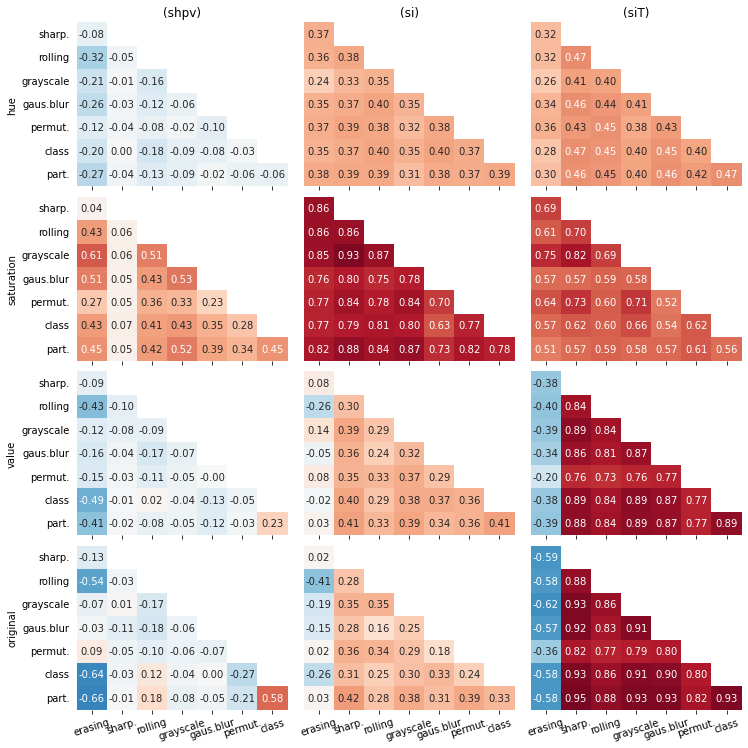


			features.5


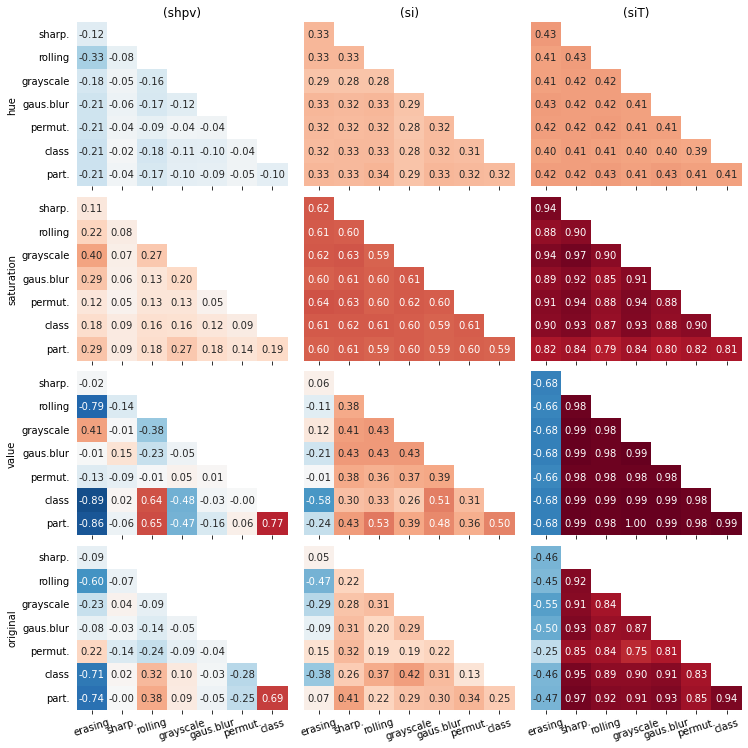


			features.7


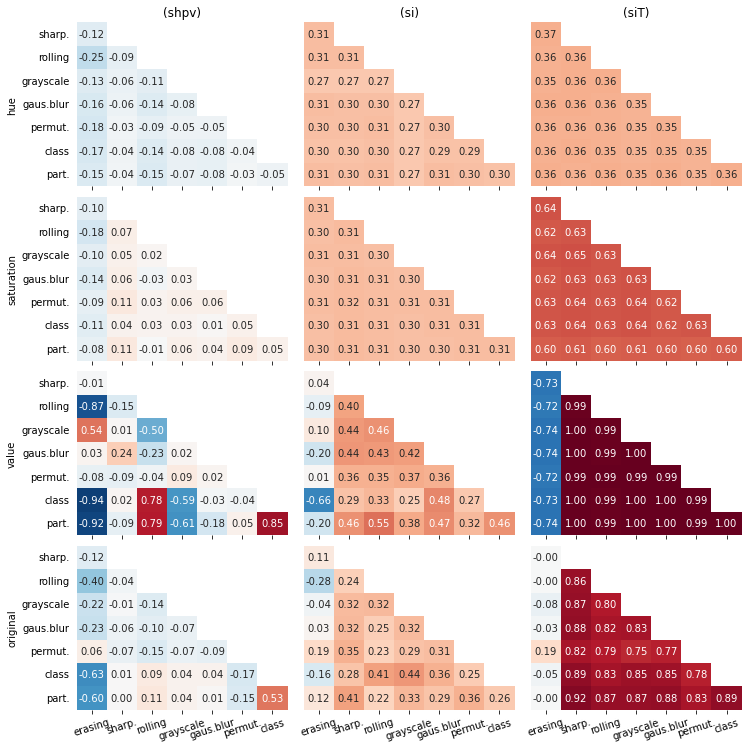


			features.9


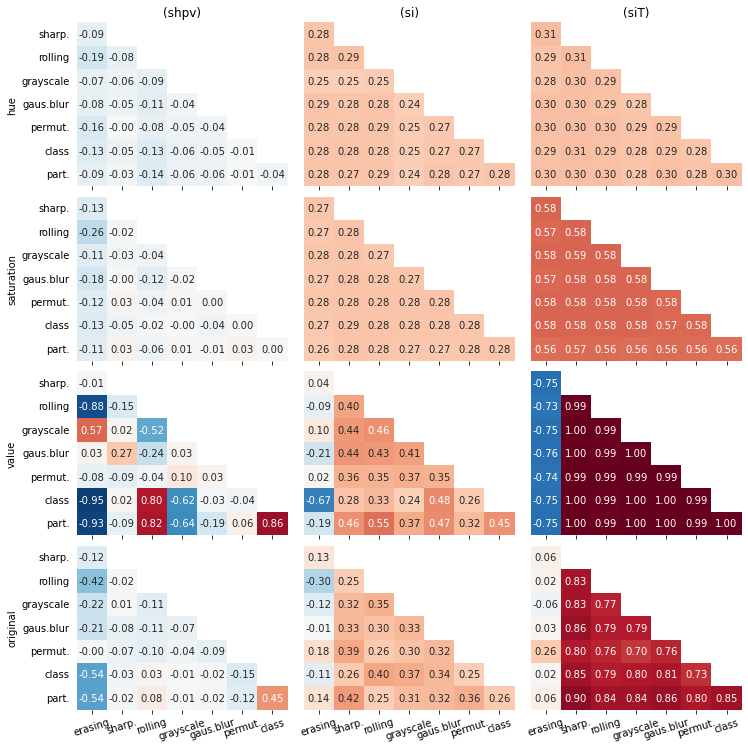


			avgpool


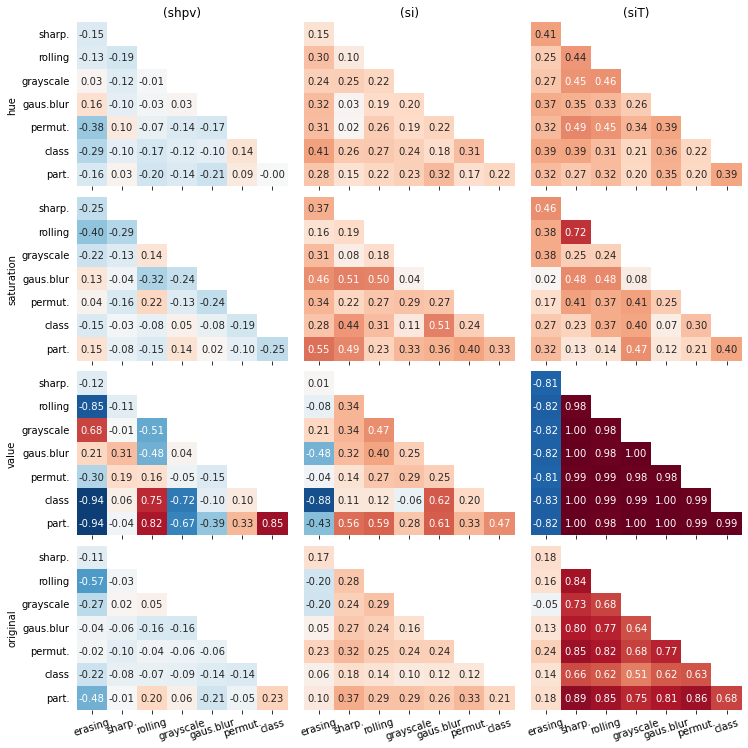

In [11]:
augmentation_set_number = 1

save_dirname = '../results/alexnet/unit_mean_pixelwise_corpat/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'unit_mean_pixelwise_corpat_aug={augmentation_set_number}'


correlation.su_visualize.unit_mean_pixelwise_correlation_patterns(
    alexnet_mean_cormat_hsv_dict[augmentation_set_number],
    alexnet_mean_cormat_orig_dict[augmentation_set_number],
    
    alexnet_network_modules,
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_cm,
    figsize=figsize_uw_means_cm_1,
    show=True,
    no_chan_name=no_chan_name,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

#### 1.2.1.2 Augmentation set 2

[[Return back]](#1.2.1-Unit-wise-means)


			features.2


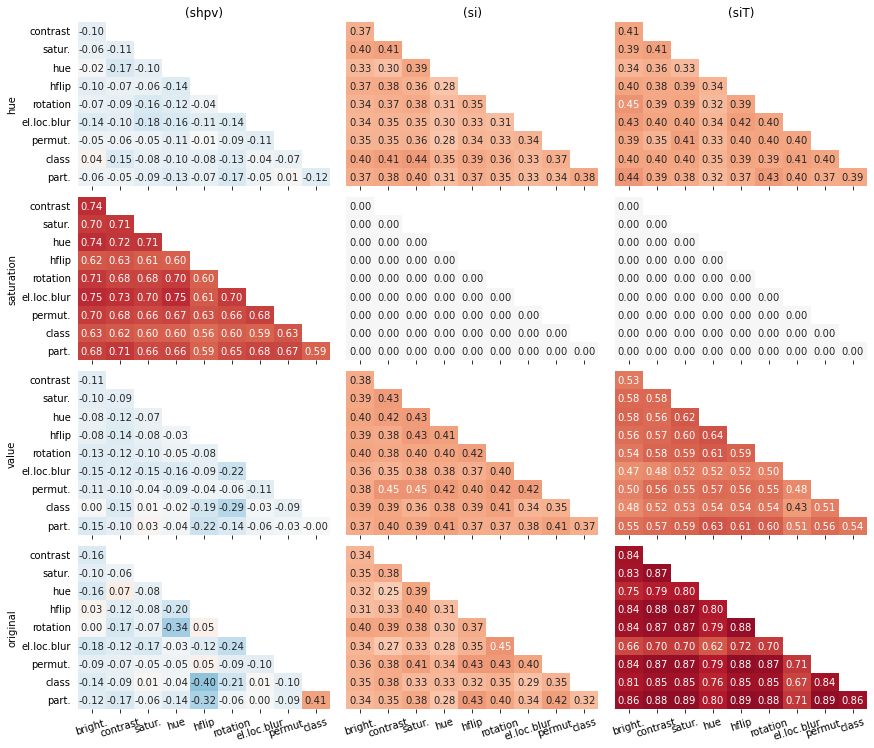


			features.5


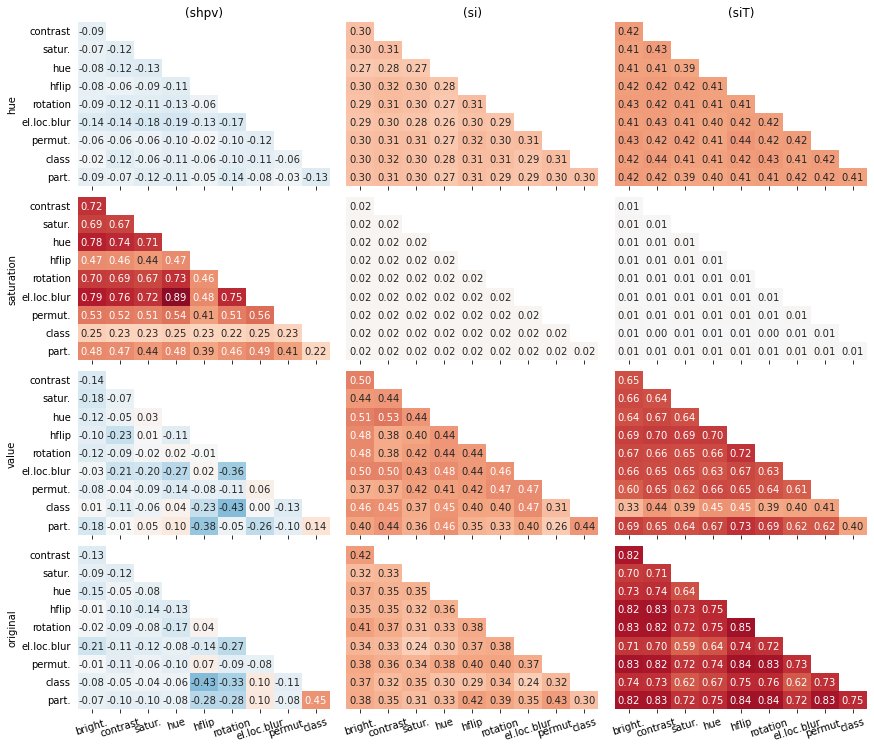


			features.7


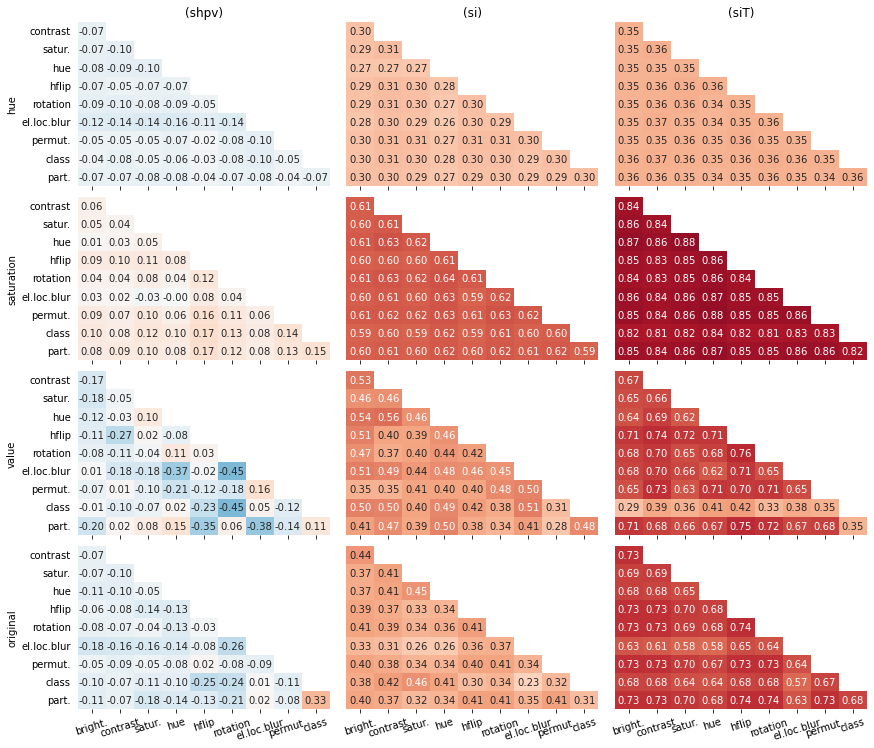


			features.9


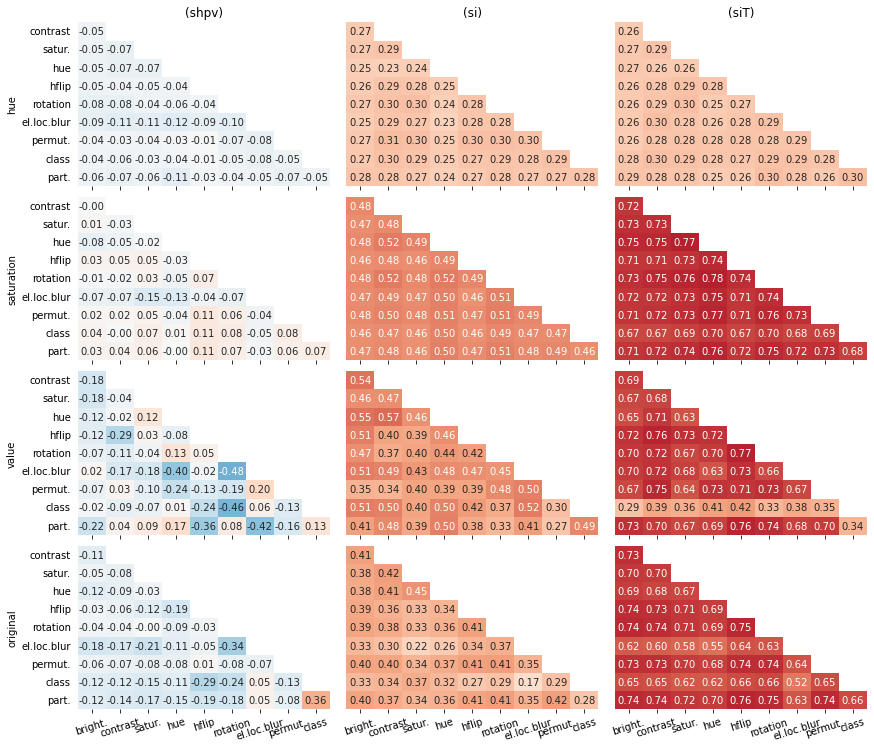


			avgpool


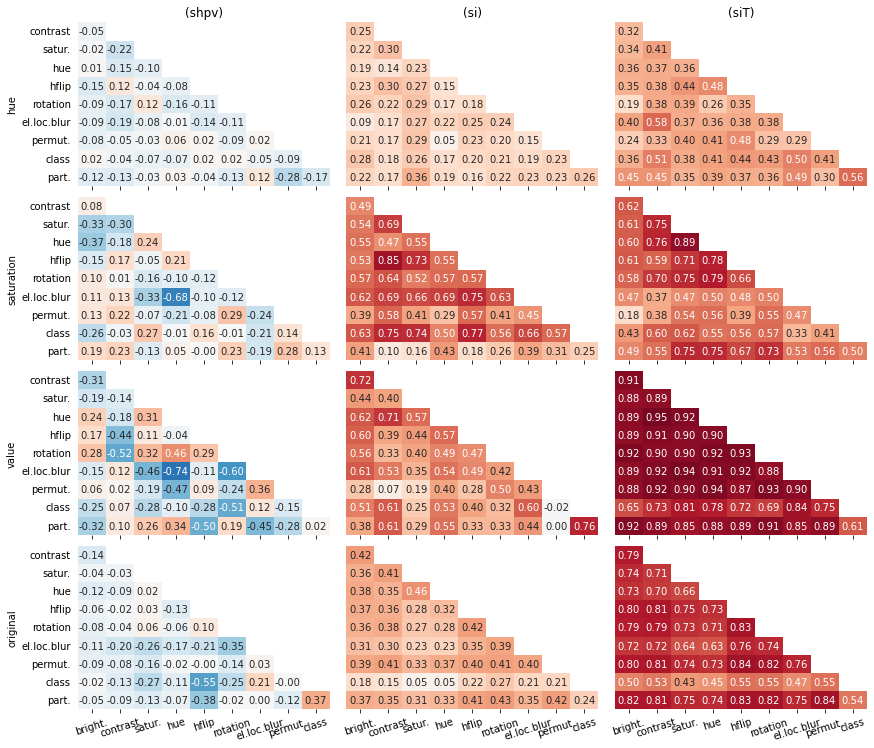

In [12]:
augmentation_set_number = 2

save_dirname = '../results/alexnet/unit_mean_pixelwise_corpat/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'unit_mean_pixelwise_corpat_aug={augmentation_set_number}'


correlation.su_visualize.unit_mean_pixelwise_correlation_patterns(
    alexnet_mean_cormat_hsv_dict[augmentation_set_number],
    alexnet_mean_cormat_orig_dict[augmentation_set_number],
    alexnet_network_modules,
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_cm,
    figsize=figsize_uw_means_cm_2,
    show=True,
    no_chan_name=no_chan_name,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

### 1.2.2 Histograms of the (unit-wise) standard deviations

- [1.2.2.1 Augmentation set 1](#1.2.2.1-Augmentation-set-1)
- [1.2.2.2 Augmentation set 2](#1.2.2.2-Augmentation-set-2)

[[Back to subsection]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 1.2.2.1 Augmentation set 1

[[Return back]](#1.2.2-Histograms-of-the-(unit-wise)-standard-deviations)


			features.2



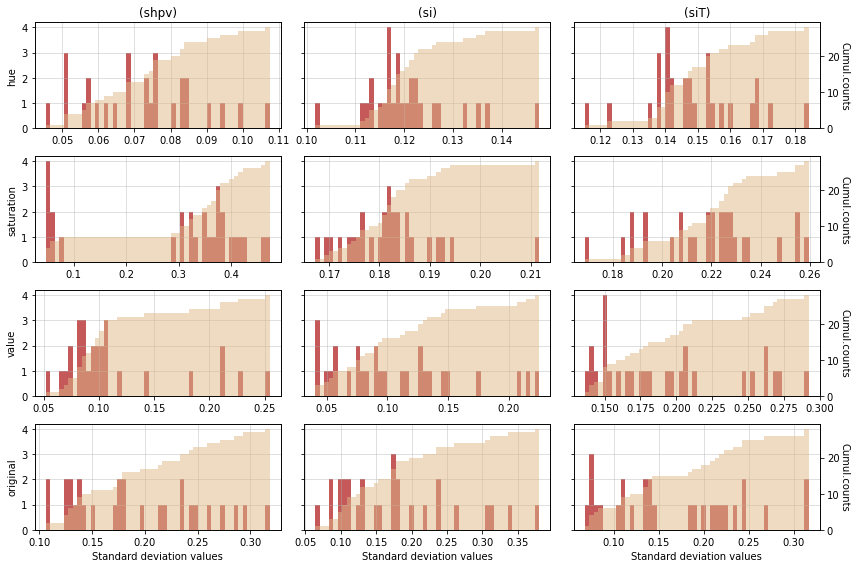


			features.5



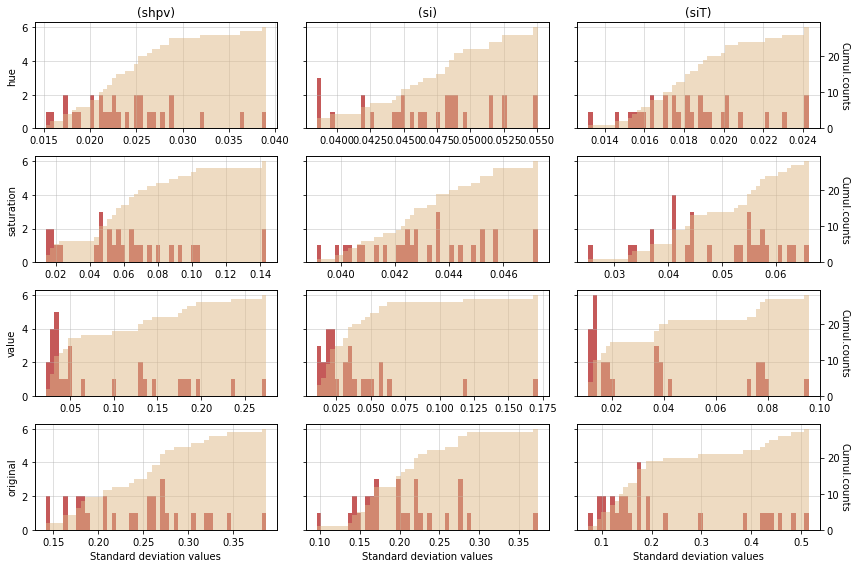


			features.7



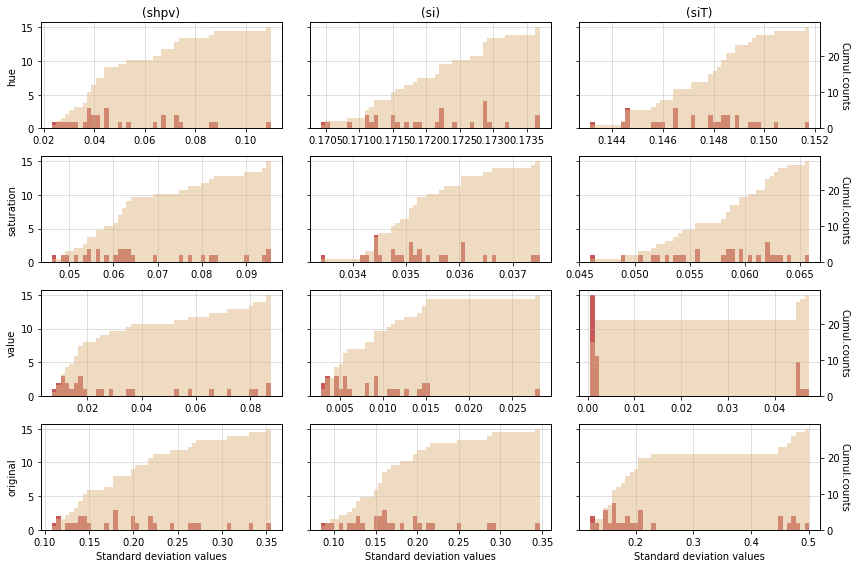


			features.9



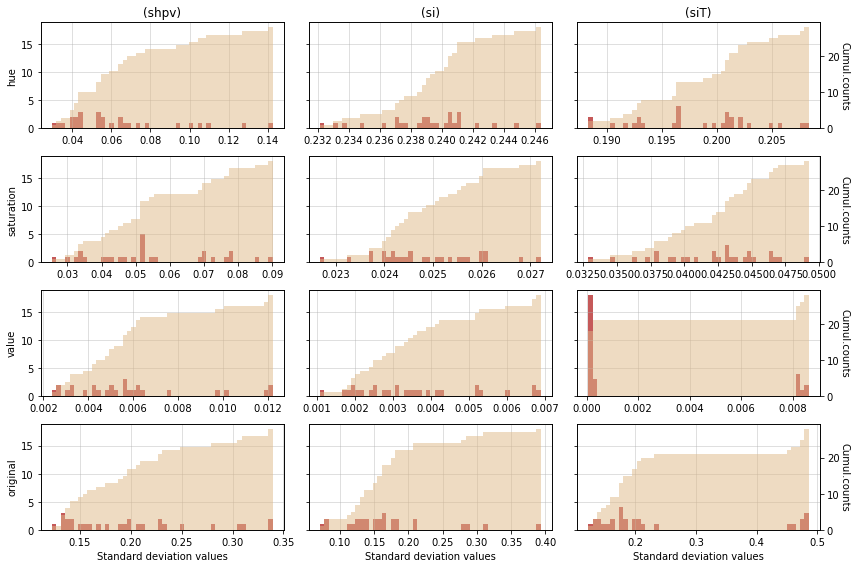


			avgpool



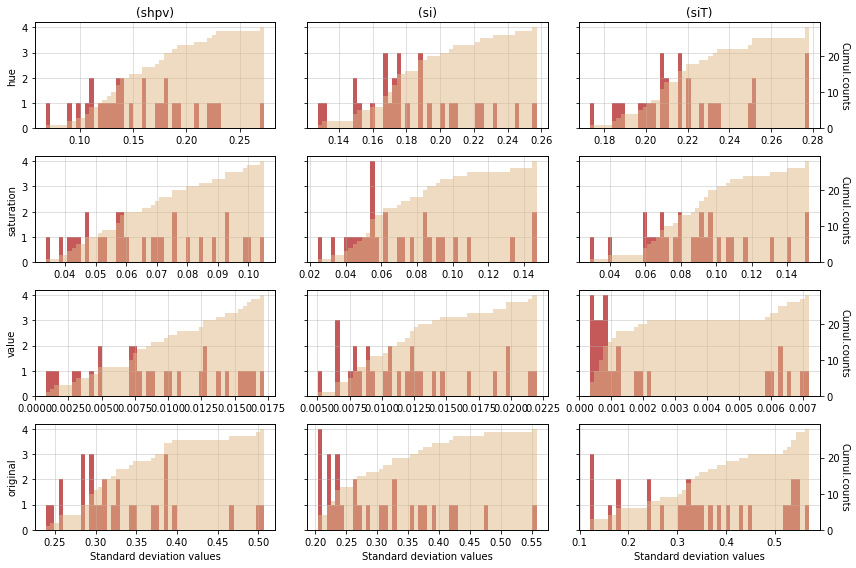

In [13]:
augmentation_set_number = 1

correlation.su_visualize.plot_hist_std_correlations_fixed_values(
    alexnet_std_cormat_hsv_dict[augmentation_set_number],
    alexnet_std_cormat_orig_dict[augmentation_set_number],
    augmentation_set_number,
    alexnet_network_modules,
    chans_name_list,
    value_name_list,
    n_conv_modules=alexnet_n_conv_modules,
    figsize=figsize_hist_uw_means_cm,
    show=True,
    color_cumul=color_cumul_uw_means_cm,
    color_bins=color_bins_uw_means_cm,
    no_chan_name=no_chan_name,
)

#### 1.2.2.2 Augmentation set 2

[[Return back]](#1.2.2-Histograms-of-the-(unit-wise)-standard-deviations)


			features.2



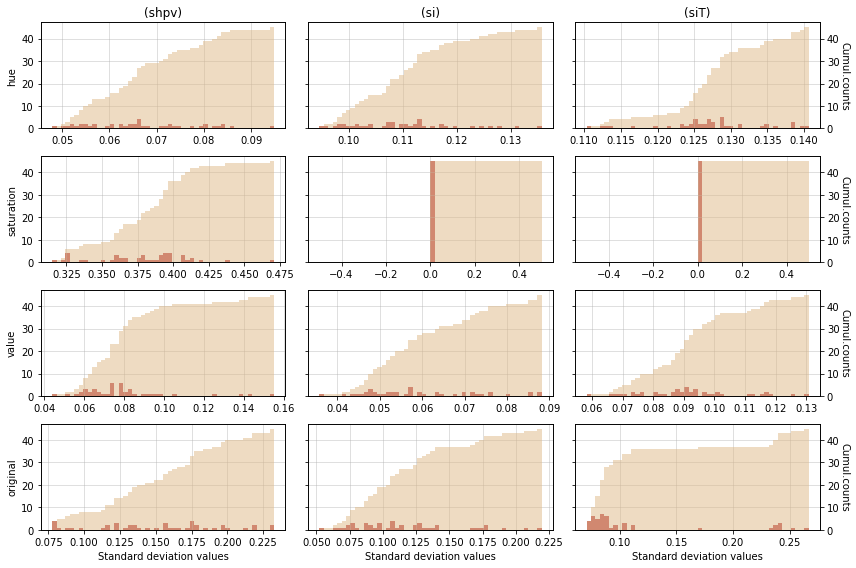


			features.5



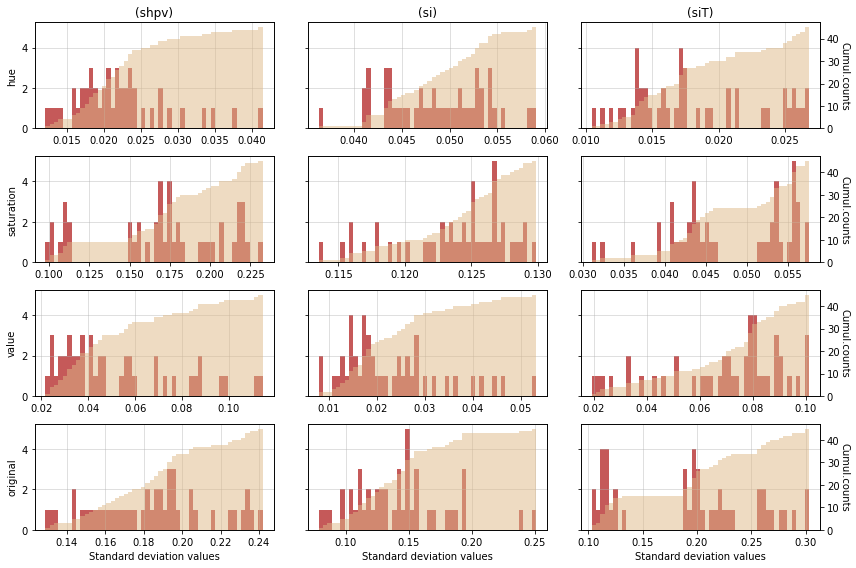


			features.7



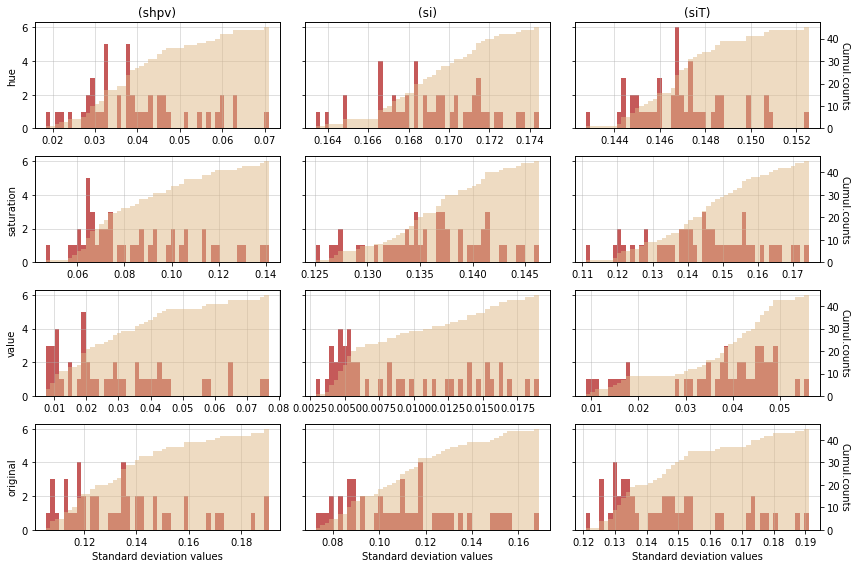


			features.9



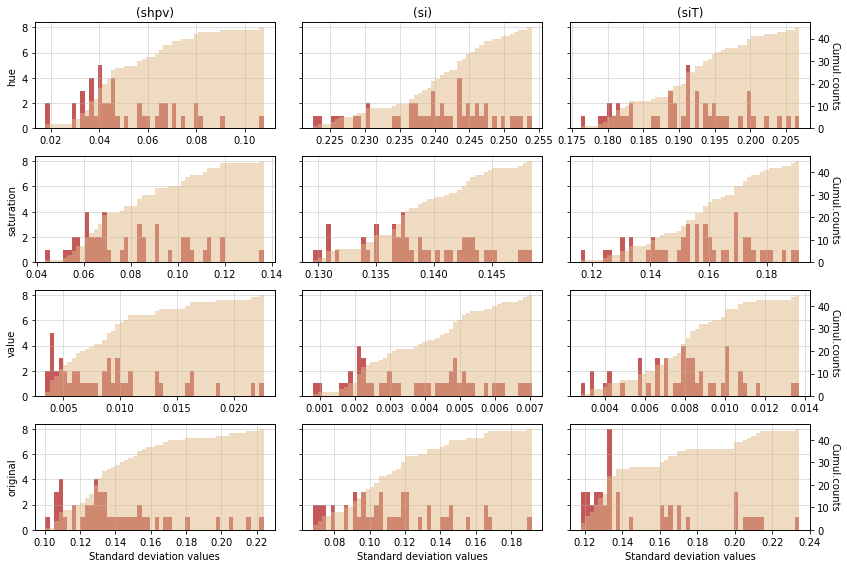


			avgpool



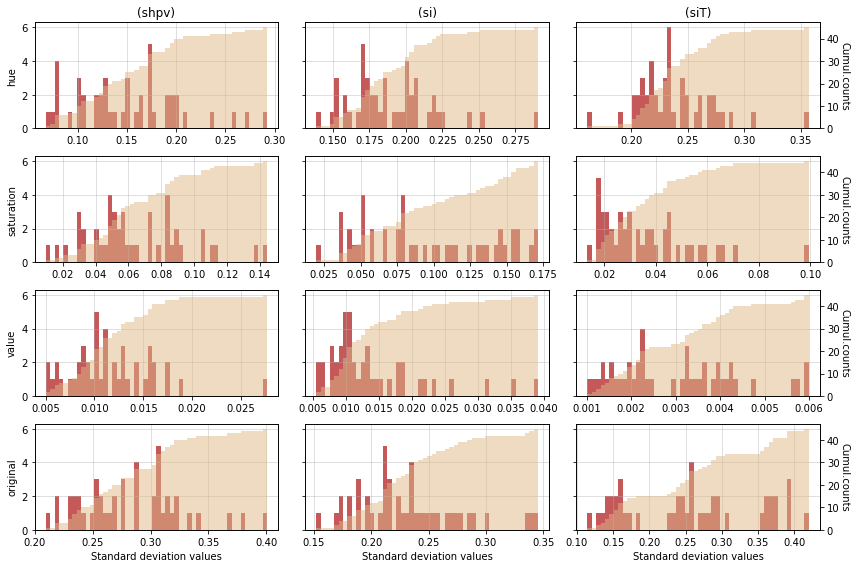

In [14]:
augmentation_set_number = 2
correlation.su_visualize.plot_hist_std_correlations_fixed_values(
    alexnet_std_cormat_hsv_dict[augmentation_set_number],
    alexnet_std_cormat_orig_dict[augmentation_set_number],
    augmentation_set_number,
    alexnet_network_modules,
    chans_name_list,
    value_name_list,
    n_conv_modules=alexnet_n_conv_modules,
    figsize=figsize_hist_uw_means_cm,
    show=True,
    color_cumul=color_cumul_uw_means_cm,
    color_bins=color_bins_uw_means_cm,
    no_chan_name=no_chan_name,
)

### 1.2.3 Consolidated summary plots

- [1.2.3.1 Augmentation set 1](#1.2.3.1-Augmentation-set-1)
- [1.2.3.2 Augmentation set 2](#1.2.3.2-Augmentation-set-2)

[[Back to subsection]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 1.2.3.1 Augmentation set 1

[[Return back]](#1.2.3-Consolidated-summary-plots)

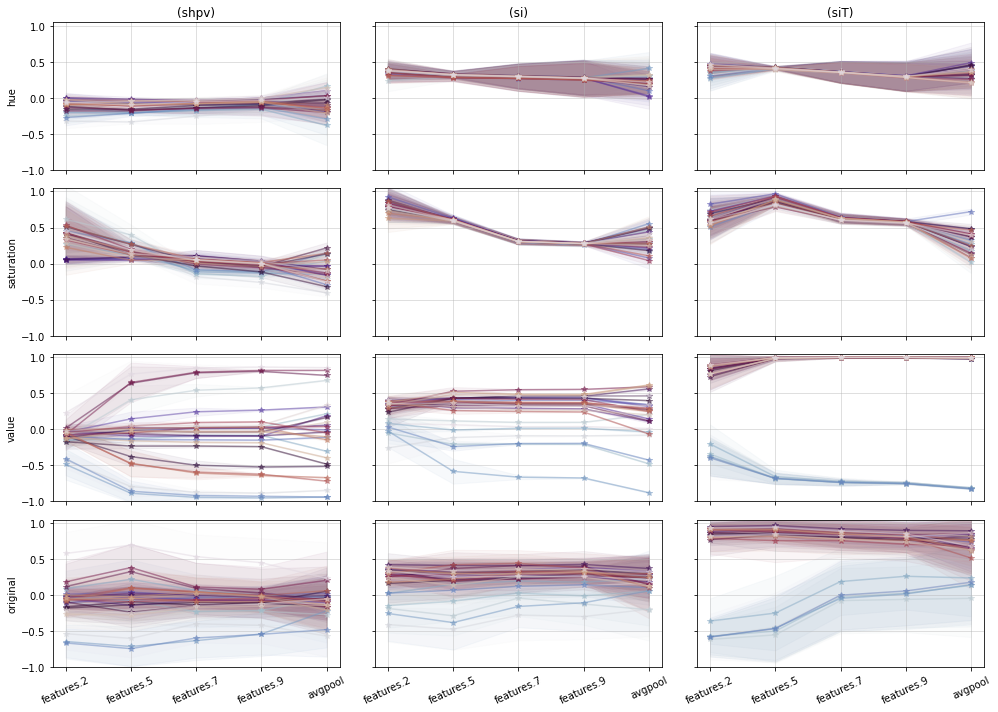

In [15]:
augmentation_set_number = 1

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_mean_cormat_hsv_dict[augmentation_set_number],
    alexnet_std_cormat_hsv_dict[augmentation_set_number],
    alexnet_mean_cormat_orig_dict[augmentation_set_number],
    alexnet_std_cormat_orig_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_corr_consolidated,
    show=True,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
)

#### 1.2.3.2 Augmentation set 2

[[Return back]](#1.2.3-Consolidated-summary-plots)

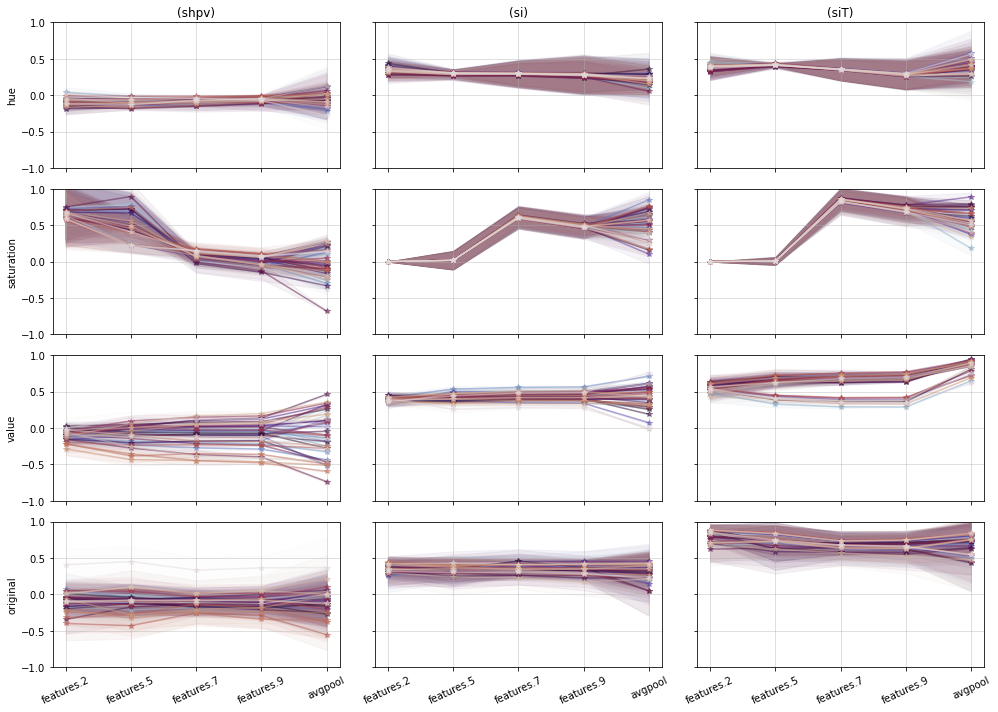

In [16]:
augmentation_set_number = 2

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_mean_cormat_hsv_dict[augmentation_set_number],
    alexnet_std_cormat_hsv_dict[augmentation_set_number],
    alexnet_mean_cormat_orig_dict[augmentation_set_number],
    alexnet_std_cormat_orig_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_corr_consolidated,
    show=True,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
)

### 1.3 Mean absolute differences between (space-wise) correlation matrices (original and cut submodule)

[[$\leftarrow$Prev.subsect.]](#1.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

- [1.3.1 Unit-wise means](#1.3.1-Unit-wise-means)
- [1.3.2 Histograms of the (unit-wise) standard deviations](#1.3.2-Histograms-of-the-(unit-wise)-standard-deviations)
- [1.3.3 Consolidated summary plots](#1.3.3-Consolidated-summary-plots)

### 1.3.1 Unit-wise means

- [1.3.1.1 Augmentation set 1](#1.3.1.2-Augmentation-set-1)
- [1.3.1.2 Augmentation set 2](#1.3.1.2-Augmentation-set-2)

[[Back to subsection]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 1.3.1.1 Augmentation set 1

[[Return back]](#1.3.1-Unit-wise-means)


			features.2


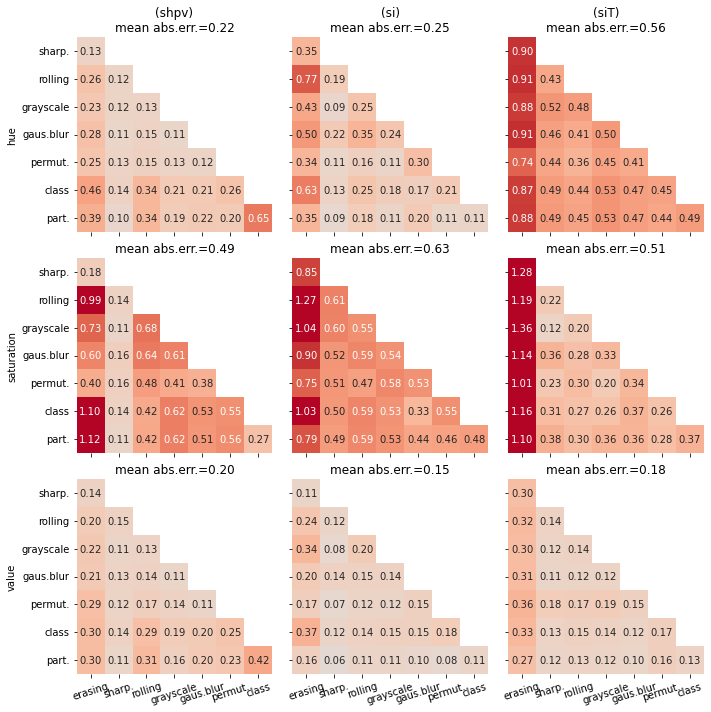


			features.5


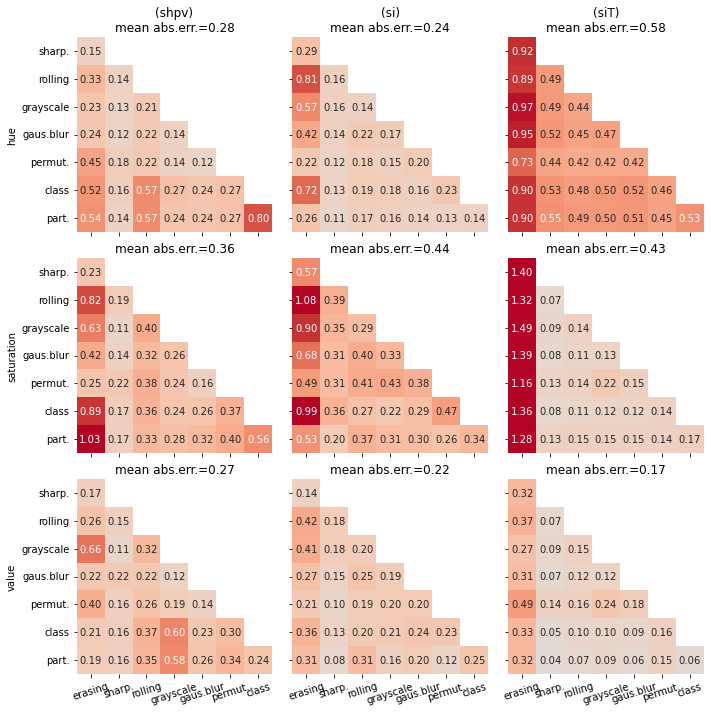


			features.7


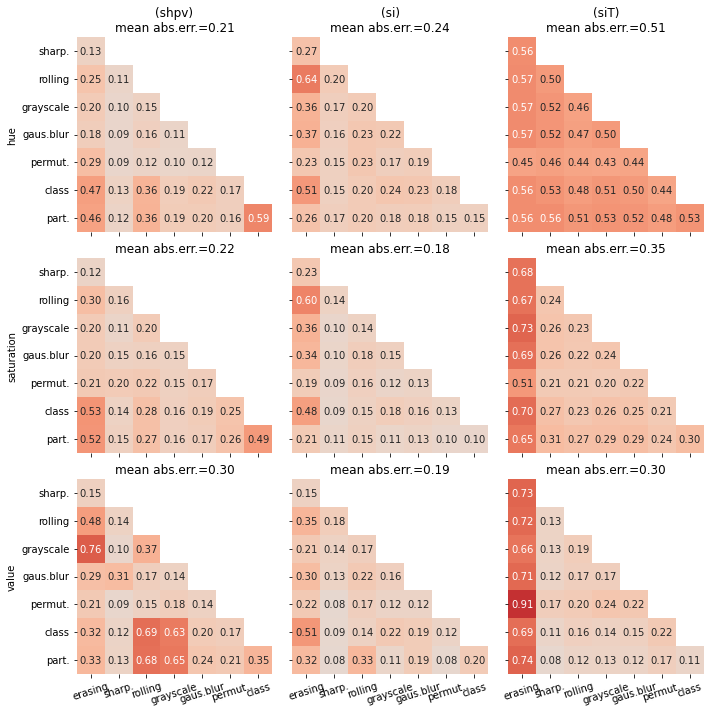


			features.9


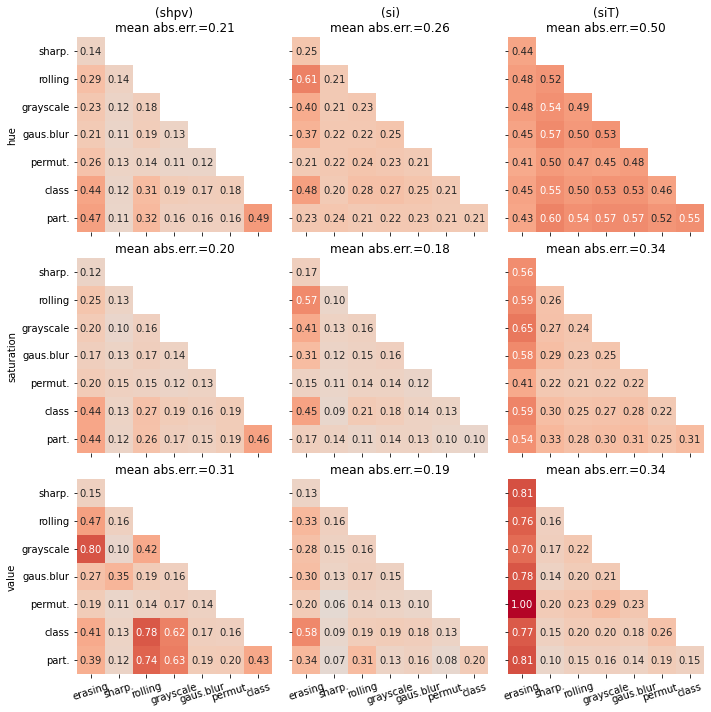


			avgpool


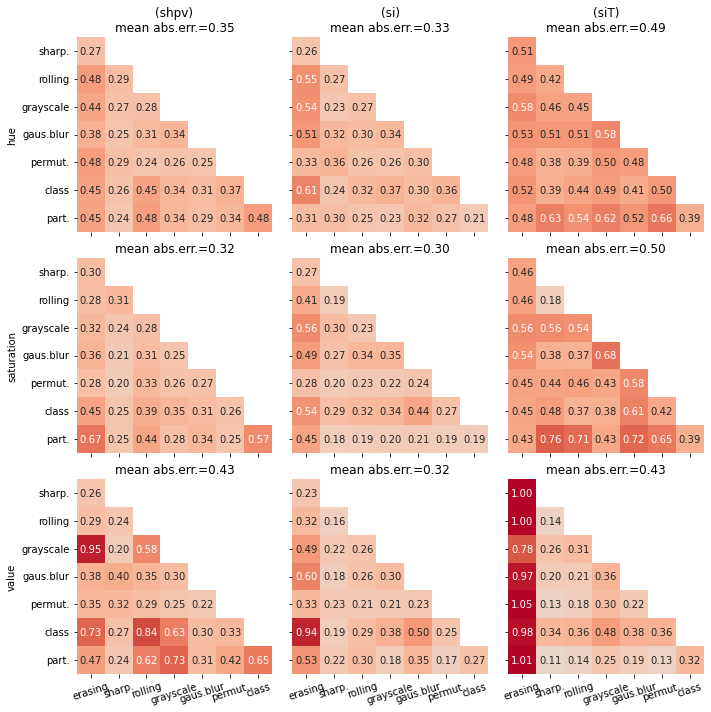

In [17]:
augmentation_set_number = 1

correlation.su_visualize.unit_mean_pixelwise_diff_correlation_patterns(
    alexnet_mean_cormat_diff[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_diff_cm,
    figsize=figsize_uw_means_diff_cm_1,
    show=show,
)

#### 1.3.1.2 Augmentation set 2

[[Return back]](#1.3.1-Unit-wise-means)


			features.2


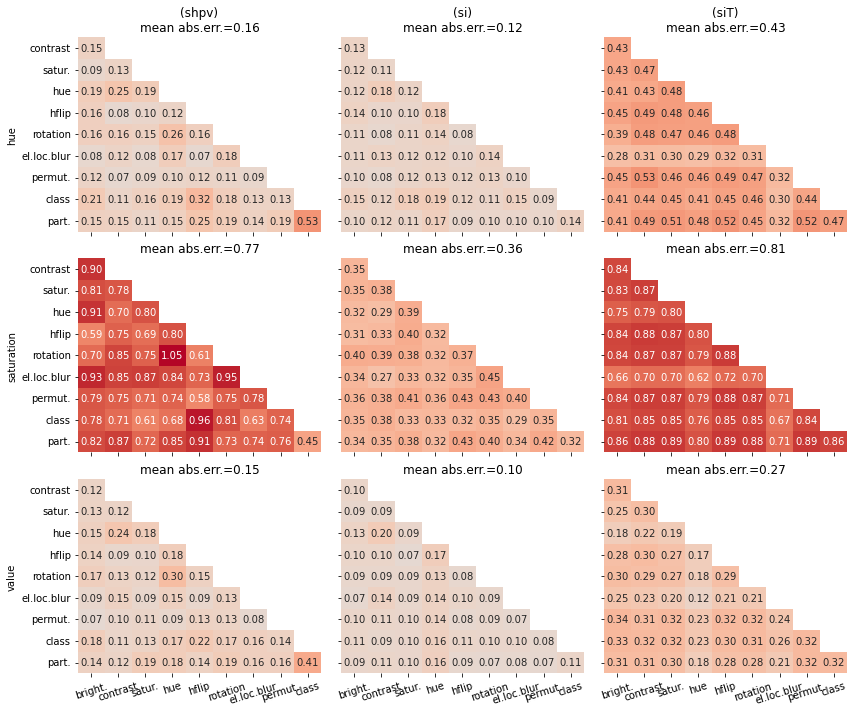


			features.5


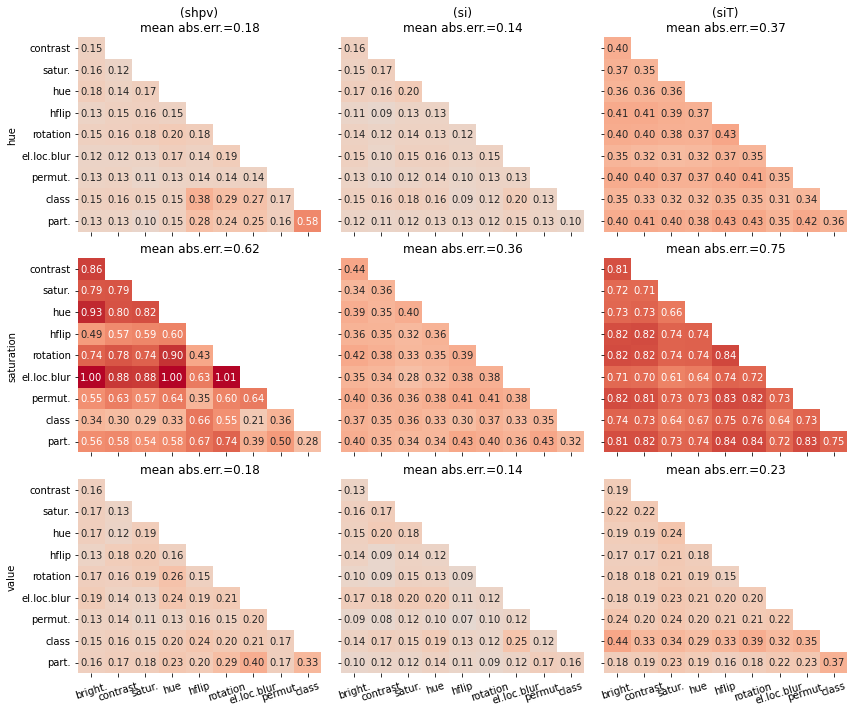


			features.7


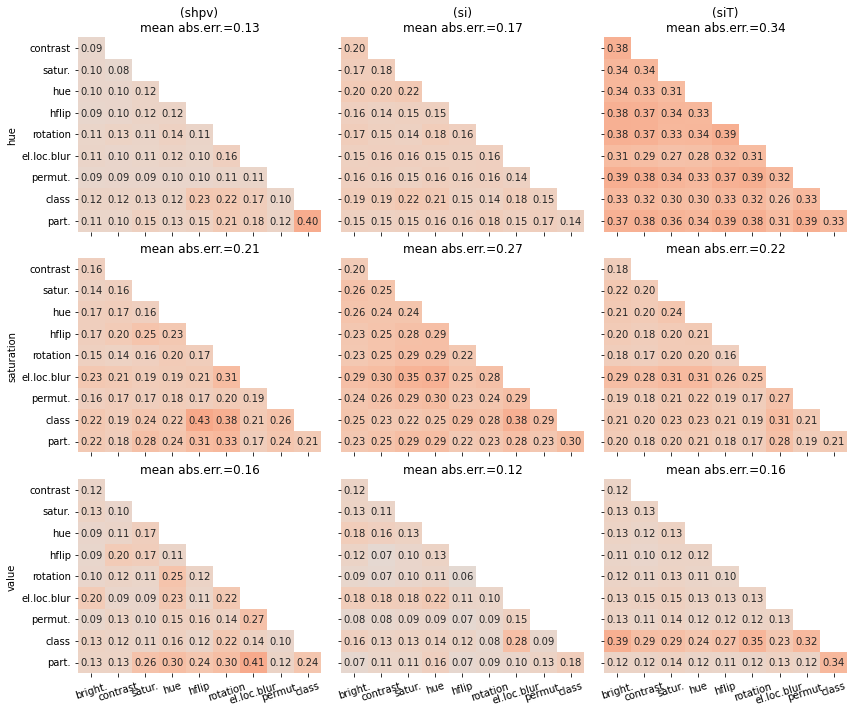


			features.9


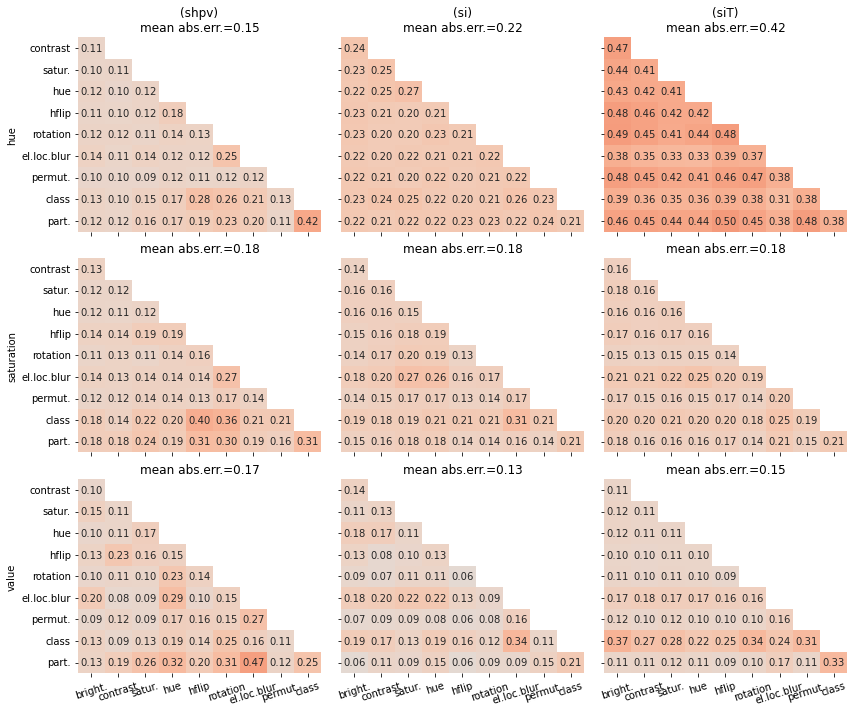


			avgpool


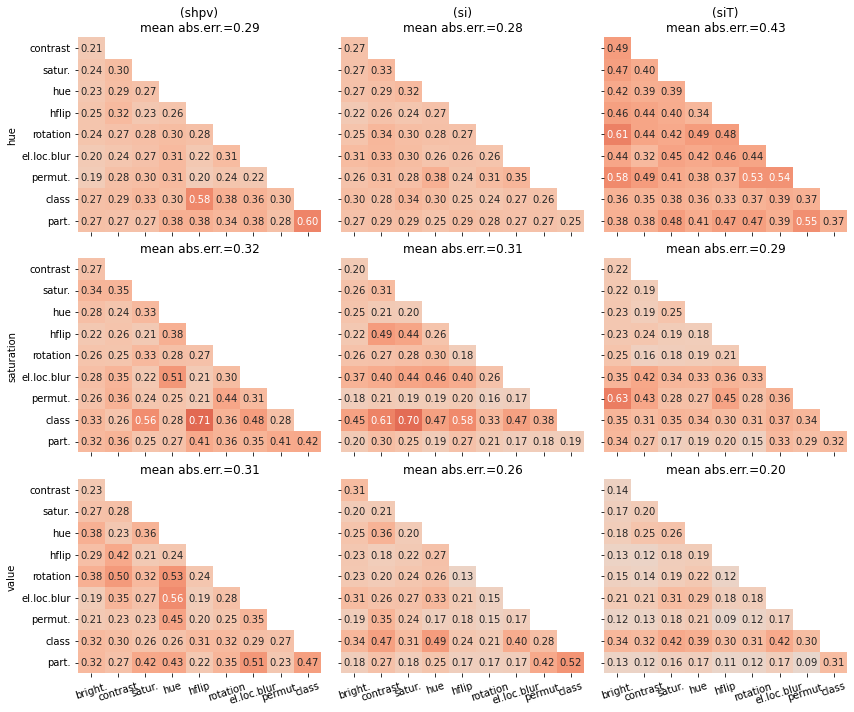

In [18]:
augmentation_set_number = 2

correlation.su_visualize.unit_mean_pixelwise_diff_correlation_patterns(
    alexnet_mean_cormat_diff[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_diff_cm,
    figsize=figsize_uw_means_diff_cm_2,
    show=show,
)

### 1.3.2 Histograms of the (unit-wise) standard deviations

- [1.3.2.1 Augmentation set 1](#1.3.2.1-Augmentation-set-1)
- [1.3.2.2 Augmentation set 2](#1.3.2.2-Augmentation-set-2)

[[Back to subsection]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 1.3.2.1 Augmentation set 1

[[Return back]](#1.3.2-Histograms-of-the-(unit-wise)-standard-deviations)


			features.2



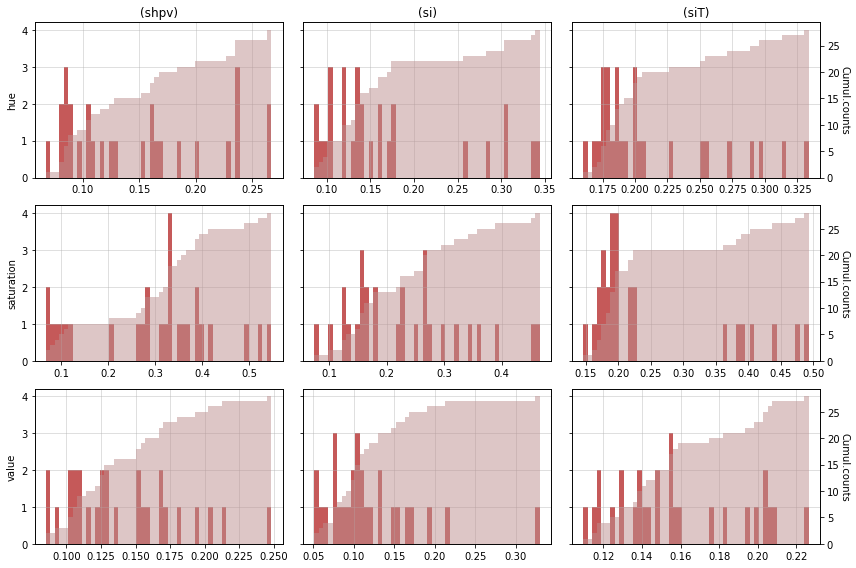


			features.5



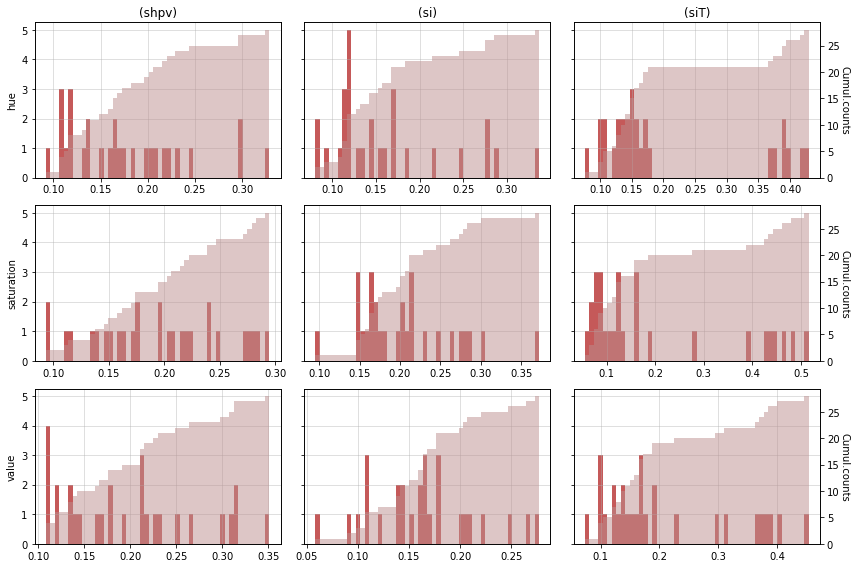


			features.7



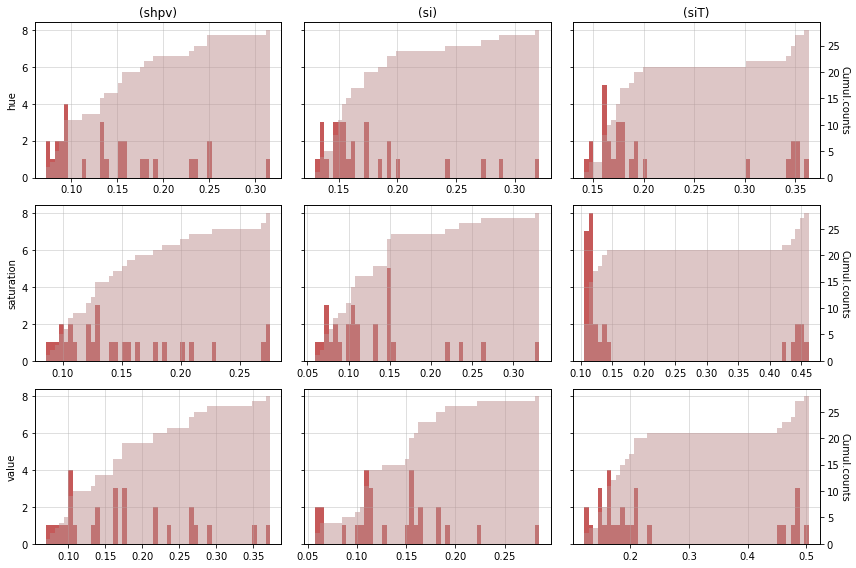


			features.9



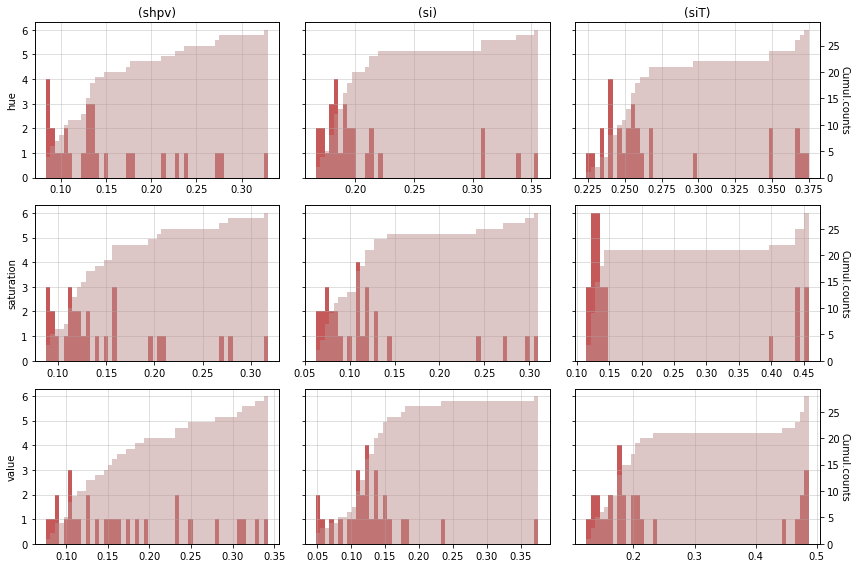


			avgpool



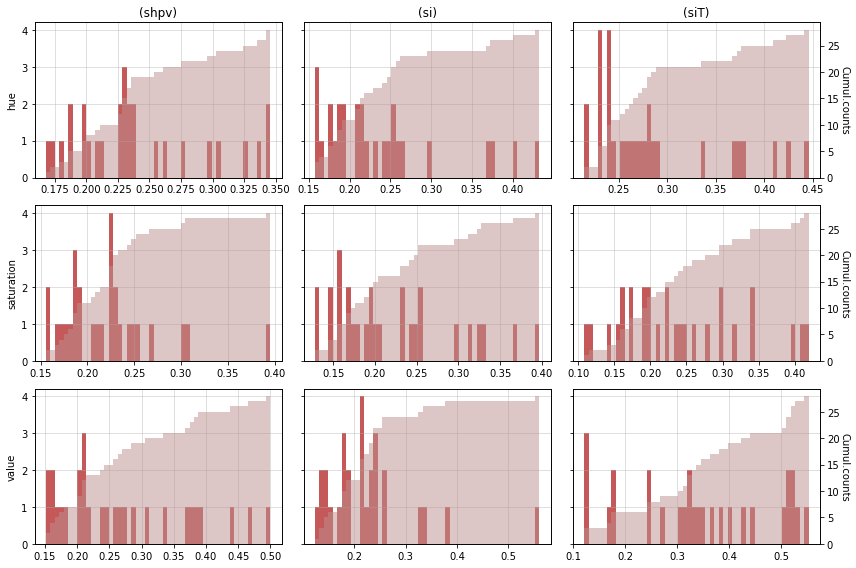

In [19]:
augmentation_set_number = 1

correlation.su_visualize.plot_hist_std_correlations_fixed_values(
    alexnet_std_cormat_diff[augmentation_set_number],
    None,
    augmentation_set_number,
    alexnet_network_modules,
    chans_name_list,
    value_name_list,
    n_conv_modules=alexnet_n_conv_modules,
    figsize=figsize_hist_uw_means_diff_cm,
    show=show,
    color_cumul=color_cumul_uw_means_diff_cm,
    color_bins=color_bins_uw_means_diff_cm,
    no_chan_name=no_chan_name,
)

#### 1.3.2.2 Augmentation set 2

[[Return back]](#1.3.2-Histograms-of-the-(unit-wise)-standard-deviations)


			features.2



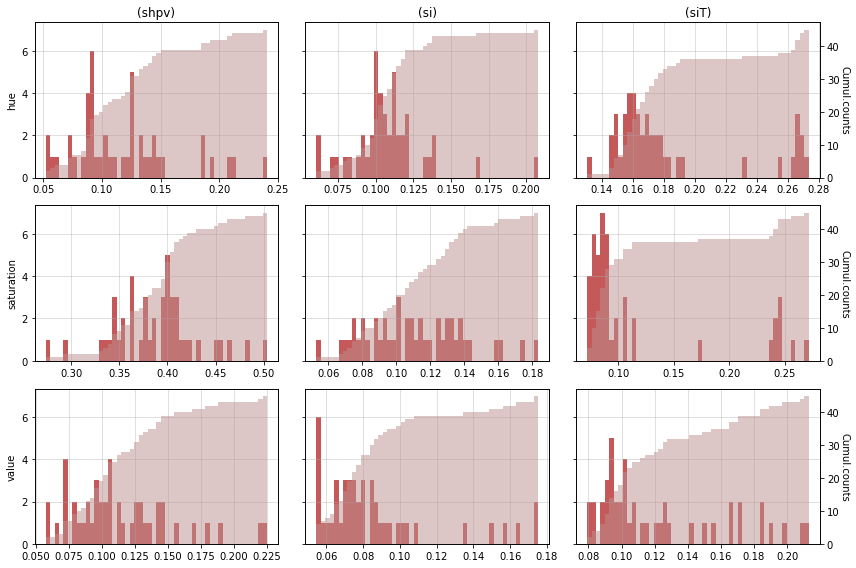


			features.5



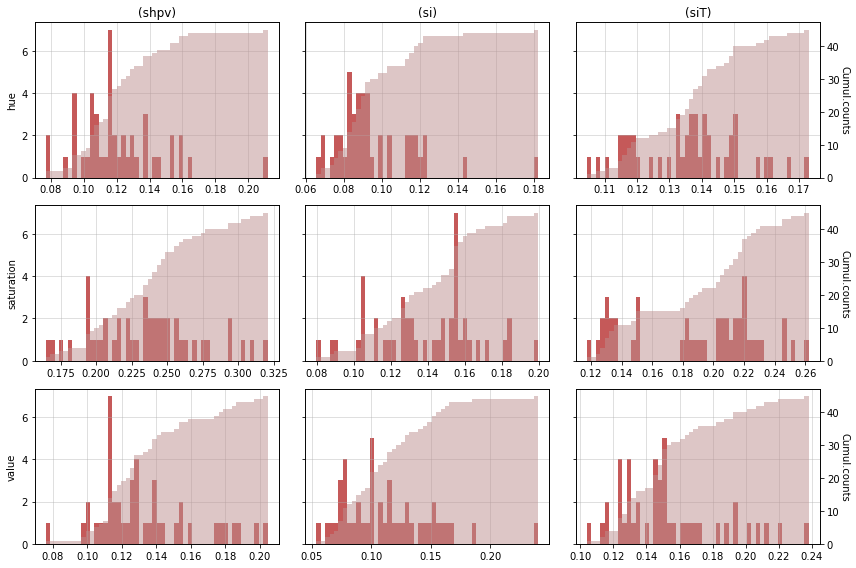


			features.7



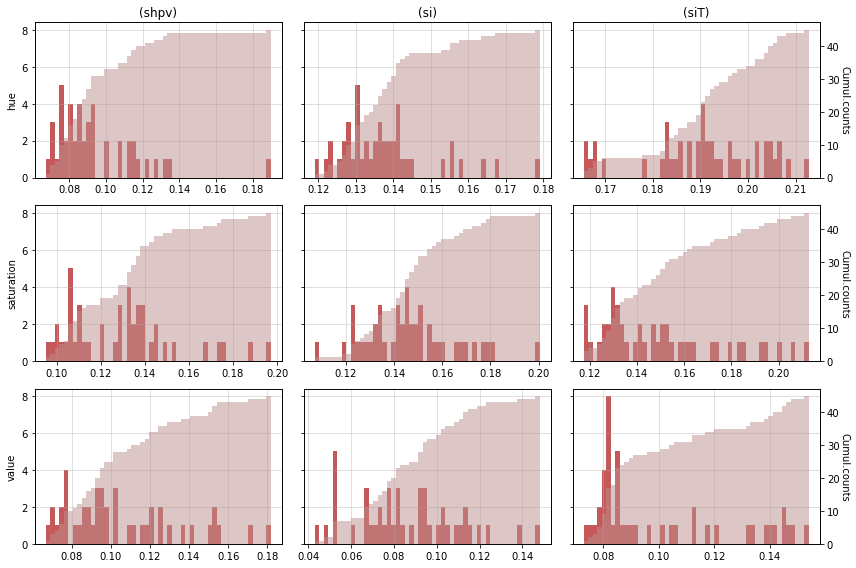


			features.9



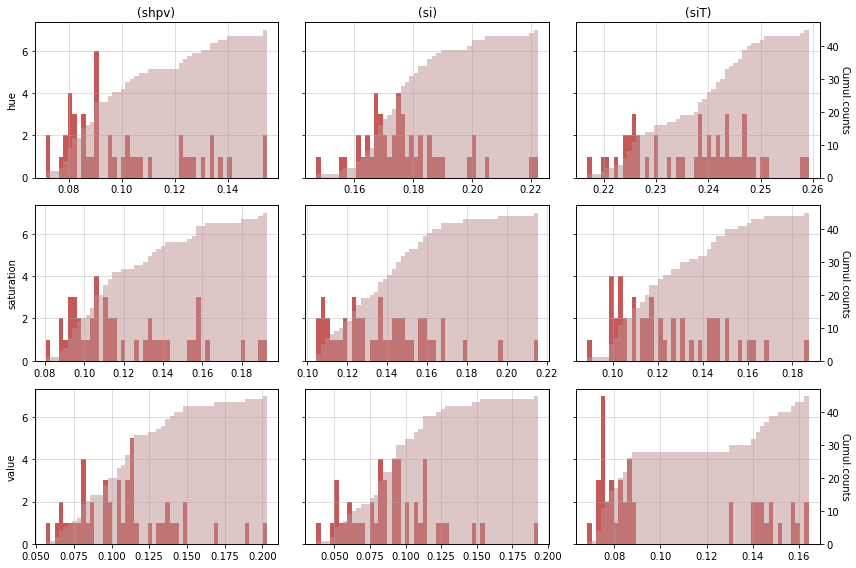


			avgpool



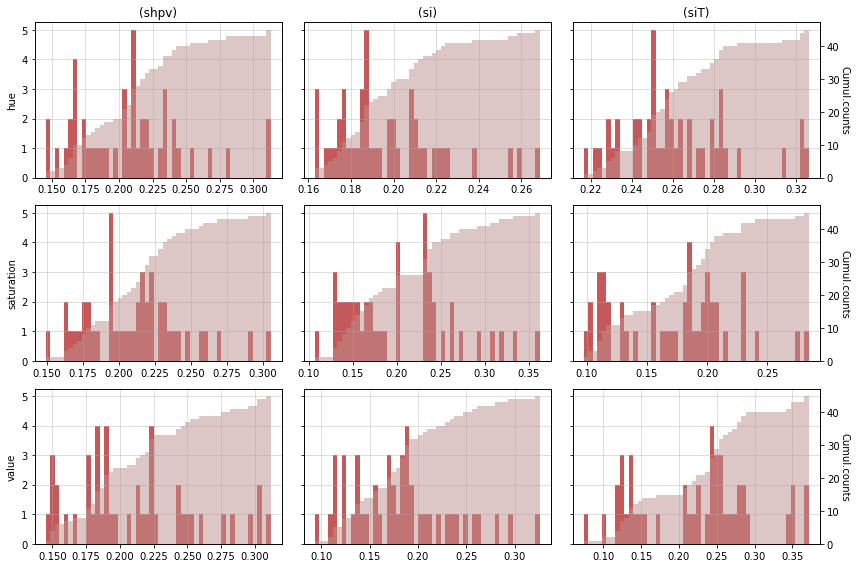

In [20]:
augmentation_set_number = 2

correlation.su_visualize.plot_hist_std_correlations_fixed_values(
    alexnet_std_cormat_diff[augmentation_set_number],
    None,
    augmentation_set_number,
    alexnet_network_modules,
    chans_name_list,
    value_name_list,
    n_conv_modules=alexnet_n_conv_modules,
    figsize=figsize_hist_uw_means_diff_cm,
    show=show,
    color_cumul=color_cumul_uw_means_diff_cm,
    color_bins=color_bins_uw_means_diff_cm,
    no_chan_name=no_chan_name,
)

### 1.3.3 Consolidated summary plots

- [1.3.3.1 Augmentation set 1](#1.3.3.1-Augmentation-set-1)
- [1.3.3.2 Augmentation set 2](#1.3.3.2-Augmentation-set-2)

[[Back to subsection]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 1.3.3.1 Augmentation set 1

[[Return back]](#1.3.3-Consolidated-summary-plots)

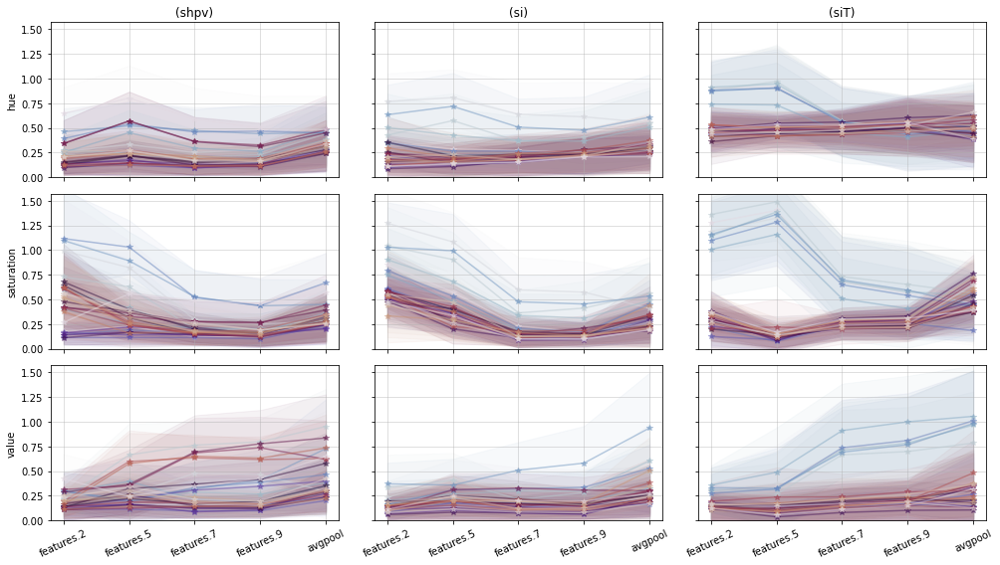

In [21]:
augmentation_set_number = 1

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_mean_cormat_diff[augmentation_set_number],
    alexnet_std_cormat_diff[augmentation_set_number],
    None,
    None,
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_corr_consolidated_diff,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
    vmin=0,
)

#### 1.3.3.2 Augmentation set 2

[[Return back]](#1.3.3-Consolidated-summary-plots)

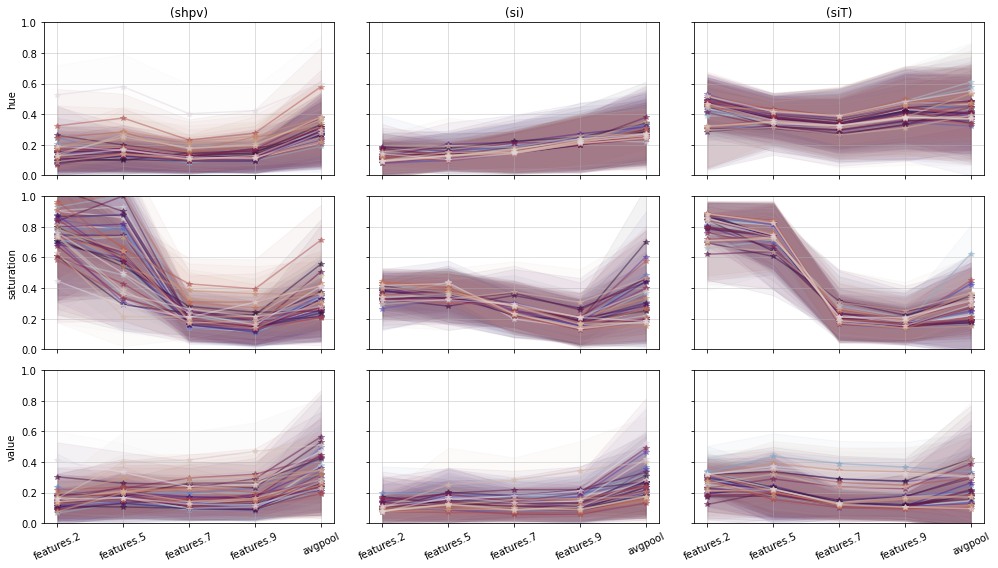

In [22]:
augmentation_set_number = 2

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_mean_cormat_diff[augmentation_set_number],
    alexnet_std_cormat_diff[augmentation_set_number],
    None,
    None,
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_corr_consolidated_diff,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
    vmin=0,
)

### 1.4 Mean absolute norm between (space-wise) correlation matrices for pairs of layers

[[$\leftarrow$Prev.subsect.]](#1.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

- [1.4.1 Unit-wise means](#1.4.1-Unit-wise-means)
- [1.4.2 Histograms of the (unit-wise) standard deviations](#1.4.2-Histograms-of-the-(unit-wise)-standard-deviations)

### 1.4.1 Unit-wise means

- [1.4.1.1 Augmentation set 1](#1.4.1.2-Augmentation-set-1)
- [1.4.1.2 Augmentation set 2](#1.4.1.2-Augmentation-set-2)

[[Back to subsection]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

#### 1.4.1.1 Augmentation set 1

[[Return back]](#1.4.1-Unit-wise-means)

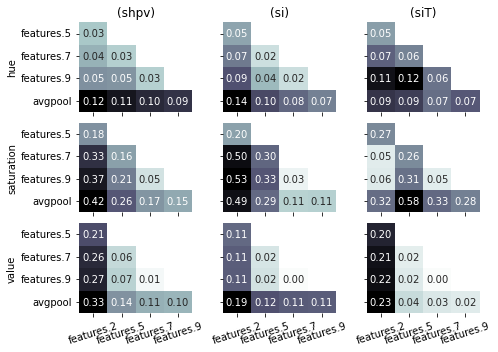

In [23]:
augmentation_set_number = 1

save_dirname = '../results/alexnet/hsv_diff_patterns_among_checkpoints/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_among_chkpts'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_mean_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap=cmap_unit_cm_patterns,
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
)

#### 1.4.1.2 Augmentation set 2

[[Return back]](#1.4.1-Unit-wise-means)

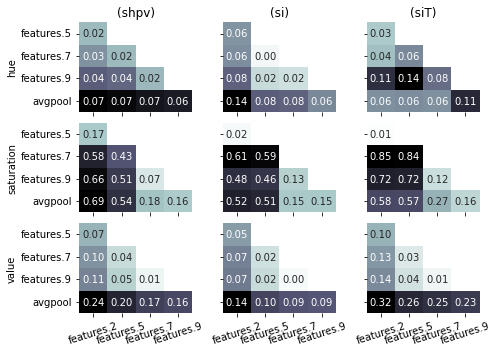

In [24]:
augmentation_set_number = 2

save_dirname = '../results/alexnet/hsv_diff_patterns_among_checkpoints/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_among_chkpts'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_mean_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap=cmap_unit_cm_patterns,
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
)

### 1.4.2 Histograms of the (unit-wise) standard deviations

- [1.4.2.1 Augmentation set 1](#1.4.2.2-Augmentation-set-1)
- [1.4.2.2 Augmentation set 2](#1.4.2.2-Augmentation-set-2)

[[Back to subsection]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

#### 1.4.2.1 Augmentation set 1

[[Return back]](#1.4.2-Histograms-of-the-(unit-wise)-standard-deviations)

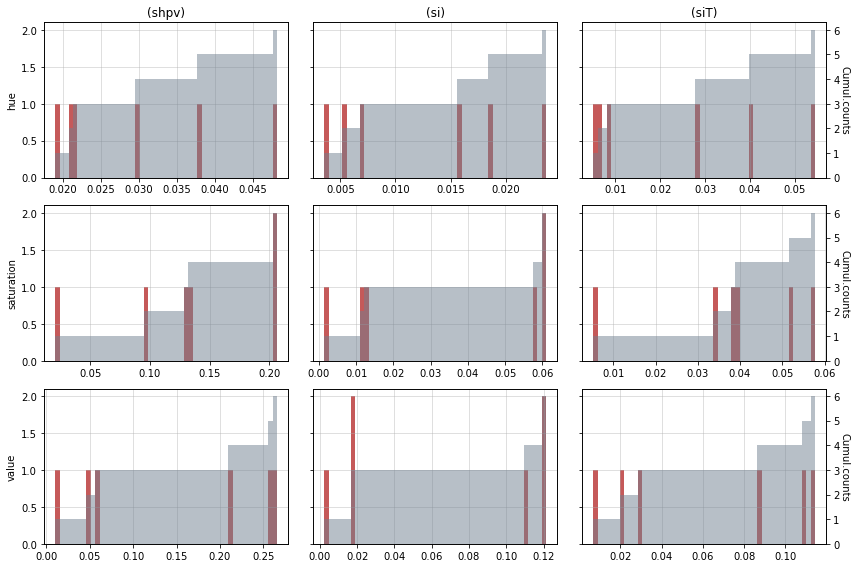

In [25]:
augmentation_set_number = 1

correlation.su_visualize.plot_hist_std_correlations_fixed_values_cross_layers(
    alexnet_cm_std_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_hist_uw_means_diff_cm_norm,
    color_cumul=color_cumul_hist_uw_means_diff_cm_norm,
    color_bins=color_bins_hist_uw_means_diff_cm_norm,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
)

#### 1.4.2.2 Augmentation set 2

[[Return back]](#1.4.2-Histograms-of-the-(unit-wise)-standard-deviations)

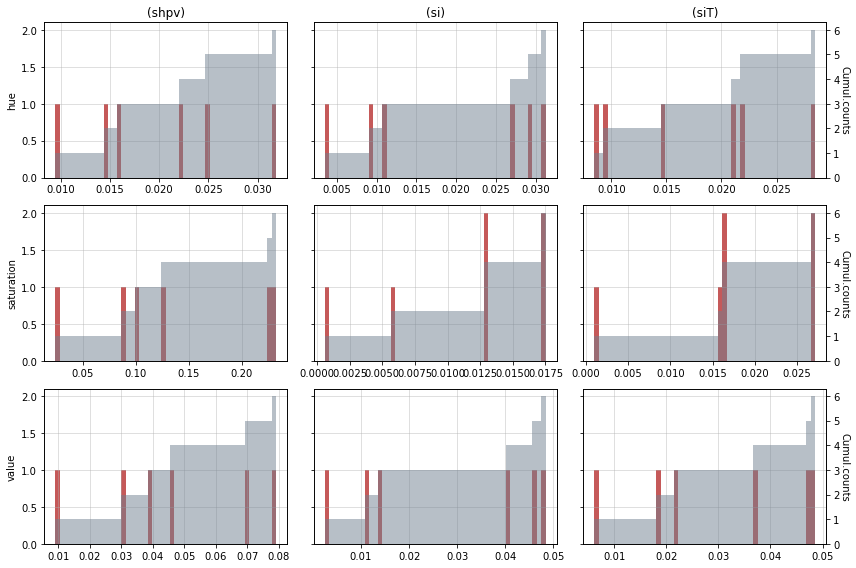

In [26]:
augmentation_set_number = 2

correlation.su_visualize.plot_hist_std_correlations_fixed_values_cross_layers(
    alexnet_cm_std_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_hist_uw_means_diff_cm_norm,
    color_cumul=color_cumul_hist_uw_means_diff_cm_norm,
    color_bins=color_bins_hist_uw_means_diff_cm_norm,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
)

### 1.5 Correlation patterns extracted from correlation matrices for paired layers

[[$\leftarrow$Prev.subsect.]](#1.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

- [1.5.1 Augmentation set 1](#1.5.1-Augmentation-set-1)
- [1.5.2 Augmentation set 2](#1.5.2-Augmentation-set-2)

#### 1.5.1 Augmentation set 1

[[Back to subsection]](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

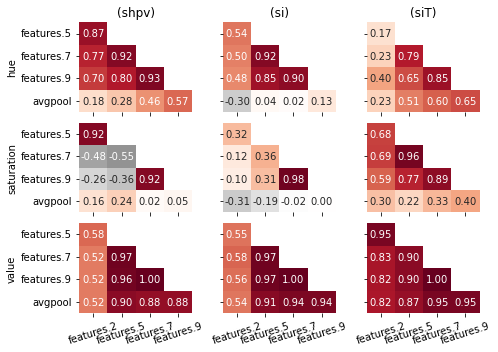

In [27]:
augmentation_set_number = 1

save_dirname = '../results/alexnet/hsv_diff_patterns_among_checkpoints_corr/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_among_chkpts_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_corr_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    #cmap='Spectral_r',
    cmap='RdGy_r',
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    cmap_bounds=(-1, 1),
    cormat_nanmask=alexnet_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number],
)

#### 1.5.2 Augmentation set 2

[[Back to subsection]](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

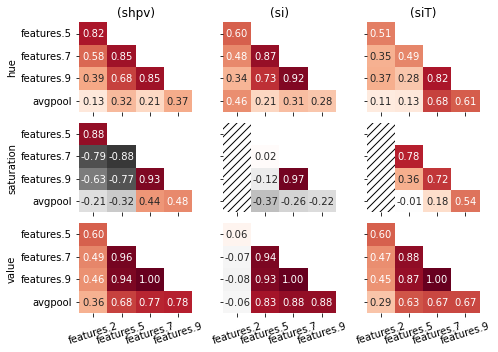

In [28]:
augmentation_set_number = 2

save_dirname = '../results/alexnet/hsv_diff_patterns_among_checkpoints_corr/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_among_chkpts_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_corr_hsv_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap='RdGy_r',
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    cmap_bounds=(-1, 1),
    cormat_nanmask=alexnet_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number],
)

### 1.6 Mean absolute norm between (space-wise) original-channel differences of correlation matrices for pairs of layers

[[$\leftarrow$Prev.subsect.]](#1.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

- [1.6.1 Unit-wise means](#1.6.1-Unit-wise-means)
- [1.6.2 Histograms of the (unit-wise) standard deviations](#1.6.2-Histograms-of-the-(unit-wise)-standard-deviations)

### 1.6.1 Unit-wise means

- [1.6.1.1 Augmentation set 1](#1.6.1.2-Augmentation-set-1)
- [1.6.1.2 Augmentation set 2](#1.6.1.2-Augmentation-set-2)

[[Back to subsection]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

#### 1.6.1.1 Augmentation set 1

[[Return back]](#1.6.1-Unit-wise-means)

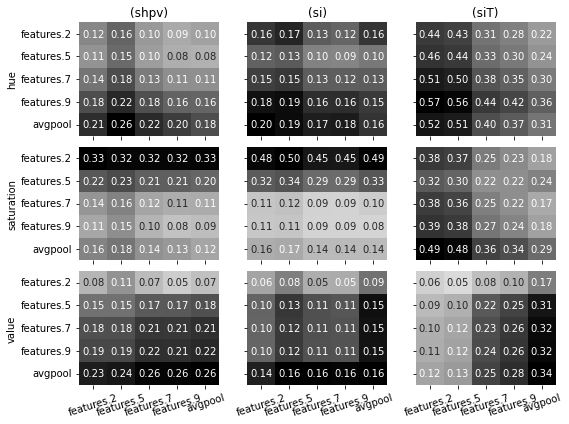

In [29]:
augmentation_set_number = 1

save_dirname = '../results/alexnet/hsv_diff_patterns_with_orig/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_with_orig'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_mean_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap=cmap_uw_means_diff_cm_norm_orig_chan,
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
)

#### 1.6.1.2 Augmentation set 2

[[Return back]](#1.6.1-Unit-wise-means)

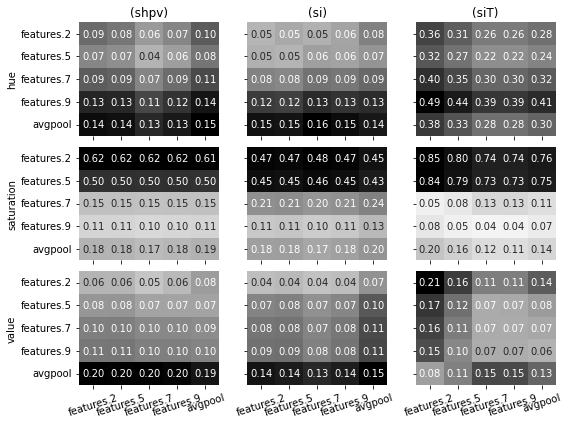

In [30]:
augmentation_set_number = 2

save_dirname = '../results/alexnet/hsv_diff_patterns_with_orig/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_with_orig'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_mean_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap=cmap_uw_means_diff_cm_norm_orig_chan,
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
)

### 1.6.2 Histograms of the (unit-wise) standard deviations

- [1.6.2.1 Augmentation set 1](#1.6.2.2-Augmentation-set-1)
- [1.6.2.2 Augmentation set 2](#1.6.2.2-Augmentation-set-2)

[[Back to subsection]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

#### 1.6.2.1 Augmentation set 1

[[Return back]](#1.6.2-Histograms-of-the-(unit-wise)-standard-deviations)

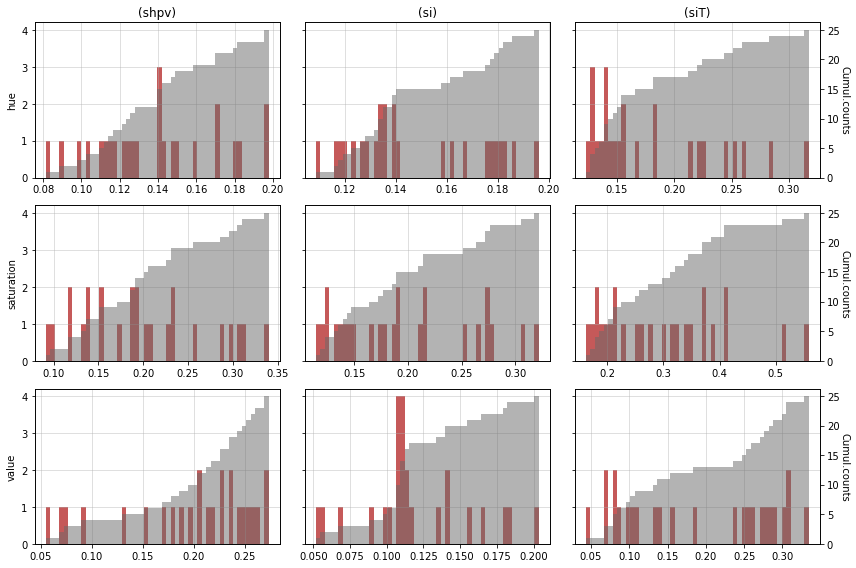

In [31]:
augmentation_set_number = 1

correlation.su_visualize.plot_hist_std_correlations_fixed_values_cross_layers(
    alexnet_cm_std_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_hist_uw_means_diff_cm_norm_orig_chan,
    show=show,
    color_cumul=color_cumul_hist_uw_means_diff_cm_norm_orig_chan,
    color_bins=color_bins_hist_uw_means_diff_cm_norm_orig_chan,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
)

#### 1.6.2.2 Augmentation set 2

[[Return back]](#1.6.2-Histograms-of-the-(unit-wise)-standard-deviations)

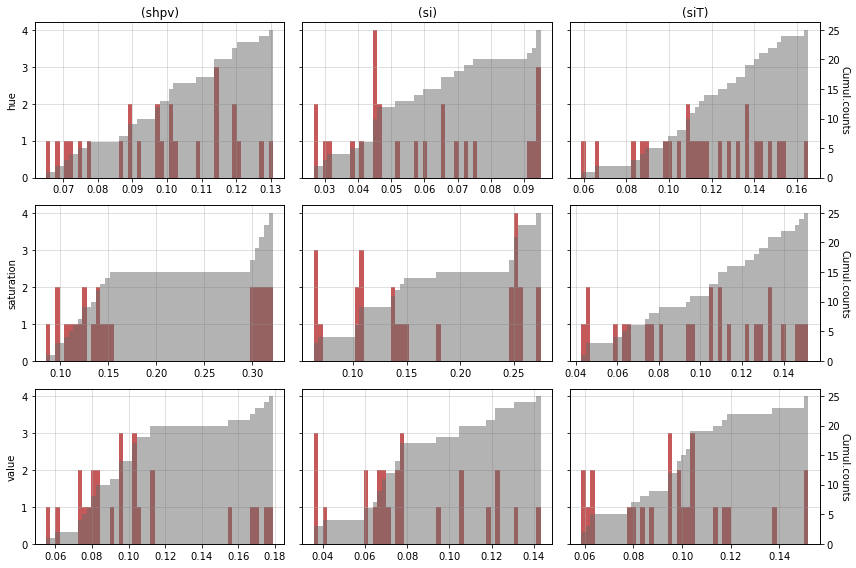

In [32]:
augmentation_set_number = 2

correlation.su_visualize.plot_hist_std_correlations_fixed_values_cross_layers(
    alexnet_cm_std_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_hist_uw_means_diff_cm_norm_orig_chan,
    show=show,
    color_cumul=color_cumul_hist_uw_means_diff_cm_norm_orig_chan,
    color_bins=color_bins_hist_uw_means_diff_cm_norm_orig_chan,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
)

### 1.7 Correlation patterns extracted from original-channel correlation matrices for paired layers

[[$\leftarrow$Prev.subsect.]](#1.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)$\quad$[[Back to section]](#1.-Alexnet)$\quad$

- [1.7.1 Augmentation set 1](#1.7.1-Augmentation-set-1)
- [1.7.2 Augmentation set 2](#1.7.2-Augmentation-set-2)

#### 1.7.1 Augmentation set 1


[[Back to subsection]](#1.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

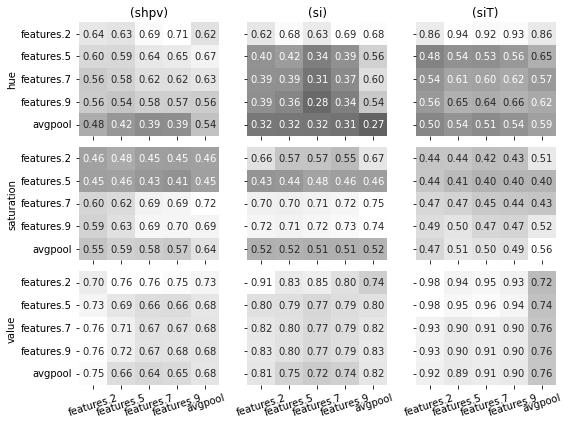

In [33]:
augmentation_set_number = 1

save_dirname = '../results/alexnet/hsv_diff_patterns_with_orig_corr/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_with_orig_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_corr_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap='gist_yarg_r',
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(-1, 1),
    cormat_nanmask=alexnet_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number],
)

#### 1.7.2 Augmentation set 2


[[Back to subsection]](#1.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

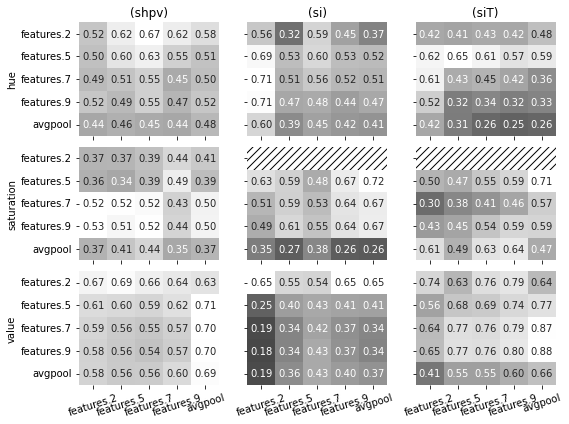

In [34]:
augmentation_set_number = 2

save_dirname = '../results/alexnet/hsv_diff_patterns_with_orig_corr/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'alexnet_hsv_diff_patterns_with_orig_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    alexnet_cm_corr_hsv_orig_diff_dict[augmentation_set_number],
    alexnet_network_modules[:alexnet_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap='gist_yarg_r',
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(-1, 1),
    cormat_nanmask=alexnet_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number],
)

## 2. ResNet18

[[$\leftarrow$ Prev.part]](#1.-Alexnet) $\qquad$ [[Back to top]](#Navigation) $\qquad$


- [2.1 Setting up the configuration variables](#2.1-Setting-up-the-configuration-variables)
- [2.2 Correlation (space-wise) between pairs of augmentation variables](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)
- [2.3 Mean absolute differences between (space-wise) correlation matrices (original and cut submodule)](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))
- [2.4 Mean absolute norm between (space-wise) correlation matrices for pairs of layers](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)
- [2.5 Correlation patterns extracted from correlation matrices for paired layers](#2.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)
- [2.6 Mean absolute norm between (space-wise) original-channel differences of correlation matrices for pairs of layers](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)
- [2.7 Correlation patterns extracted from original-channel correlation matrices for paired layers](#2.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

### 2.1 Setting up the configuration variables

$\quad$ [[Back to section]](#2.-VGG11)$\quad$[[Next subsect.$\to$]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)


In [7]:
resnet18_network_name = 'resnet18'
resnet18_network_modules = [
    'maxpool', # conv2d -> BN -> ReLU -> MaxPool2d
    'layer1', # Basic ResNet Block 1
    'layer2', # Basic ResNet Block 2
    'layer3', # Basic ResNet Block 3
    'avgpool', # Basic ResNet Block 1 -> AvgPool
    #'fc'
]
resnet18_n_conv_modules = len(
    list(
        filter(
            lambda x: ('maxpool' in x) or ('layer' in x),# or ('avgpool' in x),
            resnet18_network_modules
        )
    )
)

resnet18_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    resnet18_network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

resnet18_hsv_values_fnms_dict = preparation.single_unit.extract_channeled_single_units_values_fnms(
    resnet18_network_name,
    su_values_fnm_base,
    augmentation_set_numbers_list,
    channels=preparation.single_unit._HSVG_channel_names,
)

resnet18_json_config_path = f'./{resnet18_network_name}_single_units.json'
resnet18_analysis_config_list = preparation.single_unit.load_config_from_json(resnet18_json_config_path)[:-1]
resnet18_analysis_config_list = preparation.single_unit.extract_neuron_indices(resnet18_analysis_config_list)

In [8]:
resnet18_results_hsv, resnet18_results_orig = preparation.utils.get_original_and_channeled_values(
    resnet18_hsv_values_fnms_dict,
    su_activations_dirname,
    resnet18_values_fnms_dict,
    activations_dirname,
    resnet18_analysis_config_list,
    resnet18_network_modules,
    values_names_dict,
    augmentation_set_numbers_list,
    shpv_group_indices_dict,
    extract_auxilliary_names=extract_auxilliary_names,
)

In [9]:
resnet18_mean_cormat_hsv_dict = {}
resnet18_std_cormat_hsv_dict = {}
resnet18_nanmask_cormat_hsv_dict = {}
resnet18_mean_cormat_orig_dict = {}
resnet18_std_cormat_orig_dict = {}
resnet18_nanmask_cormat_orig_dict = {}
resnet18_mean_cormat_diff = {}
resnet18_std_cormat_diff = {}
resnet18_nanmask_cormat_diff = {}


for augmentation_set_number in augmentation_set_numbers_list:
    (
        (mean_cormat_hsv, std_cormat_hsv, nanmask_cormat_hsv),
        (mean_cormat_orig, std_cormat_orig, nanmask_cormat_orig),
        (mean_cormat_diff, std_cormat_diff, nanmask_cormat_diff),
    ) = correlation.su_compute.extract_unit_mean_pixelwise_correlation_patterns(
        resnet18_results_hsv,
        resnet18_results_orig,
        resnet18_network_modules,
        augmentation_set_number,
        chans_name_list,
        value_name_list,
        extract_auxilliary_names=extract_auxilliary_names,
        nan_mask_policy='all',
    )
    resnet18_mean_cormat_hsv_dict[augmentation_set_number] = mean_cormat_hsv
    resnet18_std_cormat_hsv_dict[augmentation_set_number] = std_cormat_hsv
    resnet18_nanmask_cormat_hsv_dict[augmentation_set_number] = nanmask_cormat_hsv
    resnet18_mean_cormat_orig_dict[augmentation_set_number] = mean_cormat_orig
    resnet18_std_cormat_orig_dict[augmentation_set_number] = std_cormat_orig
    resnet18_nanmask_cormat_orig_dict[augmentation_set_number] = nanmask_cormat_orig
    resnet18_mean_cormat_diff[augmentation_set_number] = mean_cormat_diff
    resnet18_std_cormat_diff[augmentation_set_number] = std_cormat_diff
    resnet18_nanmask_cormat_diff[augmentation_set_number] = nanmask_cormat_diff


In [10]:
resnet18_cm_mean_hsv_diff_dict = {}
resnet18_cm_std_hsv_diff_dict = {}
resnet18_cm_corr_hsv_diff_dict = {}
resnet18_cm_corr_hsv_diff_nanmask_dict = {}

resnet18_cm_mean_hsv_orig_diff_dict = {}
resnet18_cm_std_hsv_orig_diff_dict = {}
resnet18_cm_corr_hsv_orig_diff_dict = {}
resnet18_cm_corr_hsv_orig_diff_nanmask_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    (
        (
            resnet18_cm_mean_hsv_diff,
            resnet18_cm_std_hsv_diff,
            resnet18_cm_corr_hsv_diff,
            resnet18_cm_corr_hsv_diff_nanmask,
        ),
        (
            resnet18_cm_mean_hsv_orig_diff,
            resnet18_cm_std_hsv_orig_diff,
            resnet18_cm_corr_hsv_orig_diff,
            resnet18_cm_corr_hsv_orig_diff_nanmask,
        ),
    ) = correlation.su_compute.extract_hsv_correlation_layerwise_diff_patterns(
        resnet18_mean_cormat_hsv_dict[augmentation_set_number],
        resnet18_mean_cormat_orig_dict[augmentation_set_number],
        resnet18_network_modules[:resnet18_n_conv_modules],
        augmentation_set_number,
        chans_name_list,
        value_name_list,
        extract_auxilliary_names=extract_auxilliary_names,
    )
    resnet18_cm_mean_hsv_diff_dict[augmentation_set_number] = resnet18_cm_mean_hsv_diff
    resnet18_cm_std_hsv_diff_dict[augmentation_set_number] = resnet18_cm_std_hsv_diff
    resnet18_cm_corr_hsv_diff_dict[augmentation_set_number] = resnet18_cm_corr_hsv_diff
    resnet18_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number] = resnet18_cm_corr_hsv_diff_nanmask
    resnet18_cm_mean_hsv_orig_diff_dict[augmentation_set_number] = resnet18_cm_mean_hsv_orig_diff
    resnet18_cm_std_hsv_orig_diff_dict[augmentation_set_number] = resnet18_cm_std_hsv_orig_diff
    resnet18_cm_corr_hsv_orig_diff_dict[augmentation_set_number] = resnet18_cm_corr_hsv_orig_diff
    resnet18_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number] = resnet18_cm_corr_hsv_orig_diff_nanmask

### 2.2 Correlation (space-wise) between pairs of augmentation variables

[[$\leftarrow$Prev.subsect.]](#2.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

- [2.2.1 Unit-wise means](#2.2.1-Unit-wise-means)
- [2.2.2 Histograms of the (unit-wise) standard deviations](#2.2.2-Histograms-of-the-(unit-wise)-standard-deviations)
- [2.2.3 Consolidated summary plots](#2.2.3-Consolidated-summary-plots)

### 2.2.1 Unit-wise means

- [2.2.1.1 Augmentation set 1](#2.2.1.2-Augmentation-set-1)
- [2.2.1.2 Augmentation set 2](#2.2.1.2-Augmentation-set-2)

[[Back to subsection]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 2.2.1.1 Augmentation set 1

[[Return back]](#2.2.1-Unit-wise-means)


			maxpool


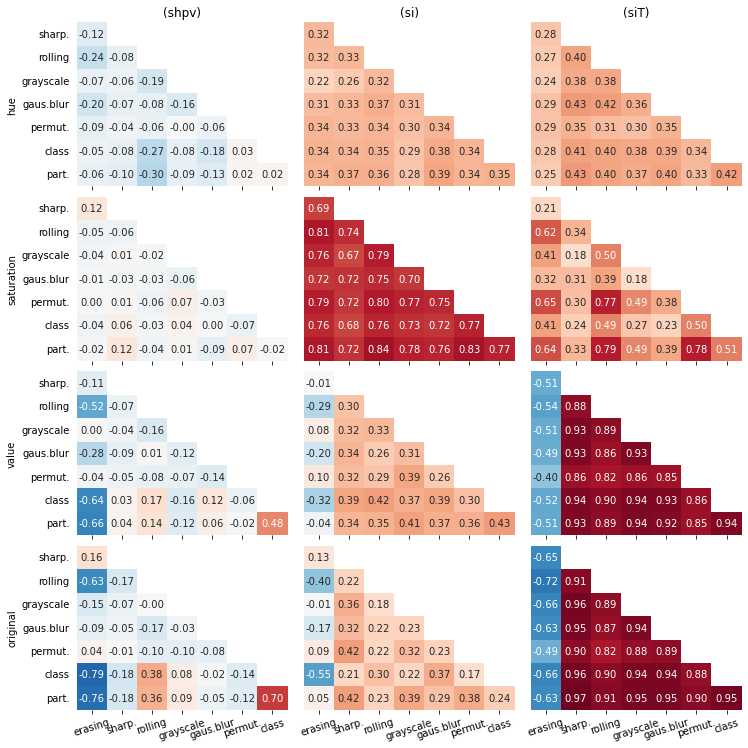


			layer1


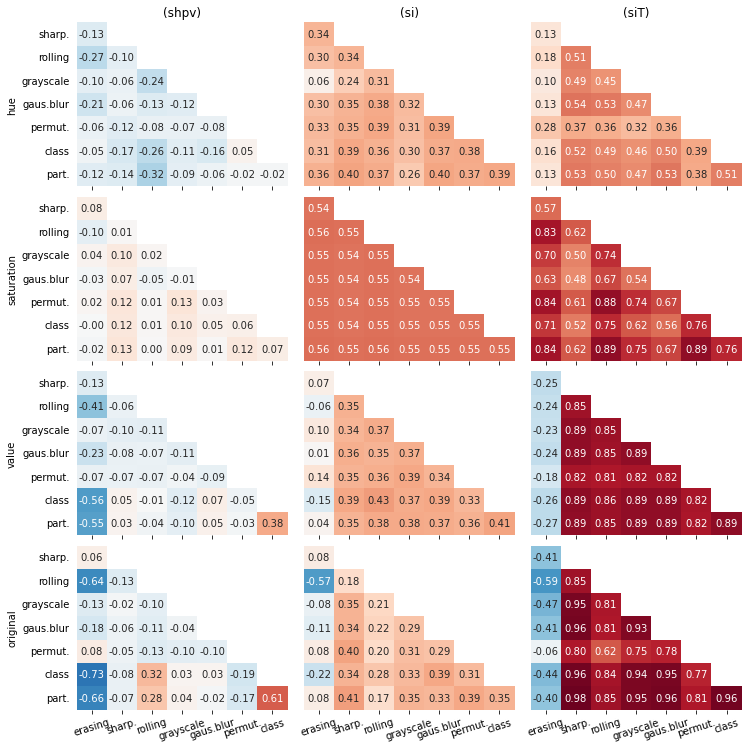


			layer2


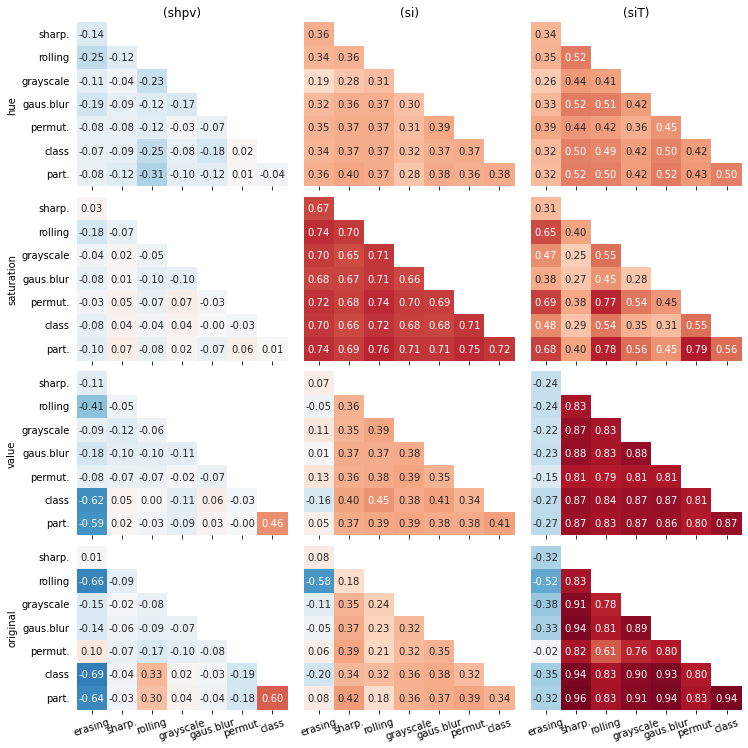


			layer3


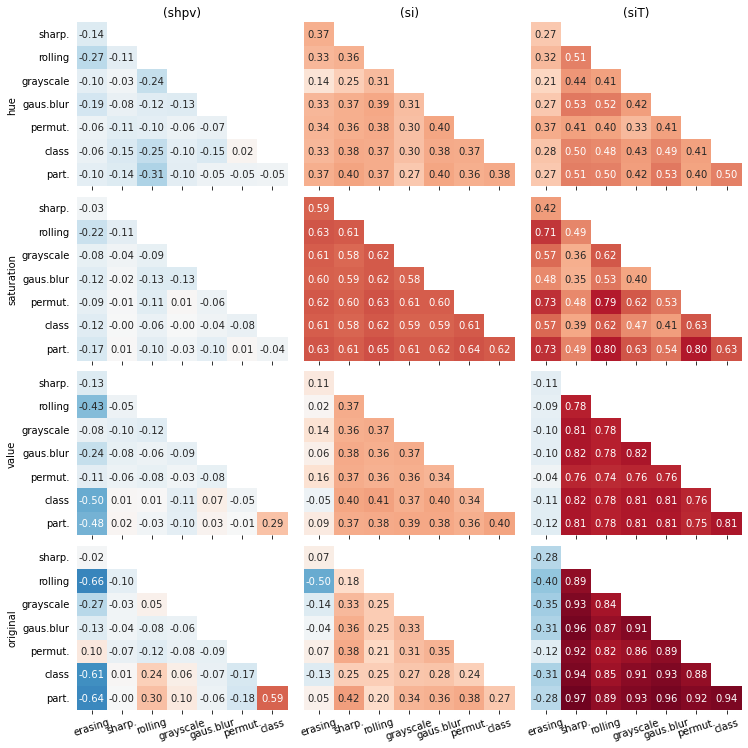

In [11]:
augmentation_set_number = 1

save_dirname = '../results/resnet18/unit_mean_pixelwise_corpat/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'unit_mean_pixelwise_corpat_aug={augmentation_set_number}'


correlation.su_visualize.unit_mean_pixelwise_correlation_patterns(
    resnet18_mean_cormat_hsv_dict[augmentation_set_number],
    resnet18_mean_cormat_orig_dict[augmentation_set_number],
    resnet18_network_modules,
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_cm,
    figsize=figsize_uw_means_cm_1,
    show=show,
    no_chan_name=no_chan_name,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

#### 2.2.1.2 Augmentation set 2

[[Return back]](#2.2.1-Unit-wise-means)


			maxpool


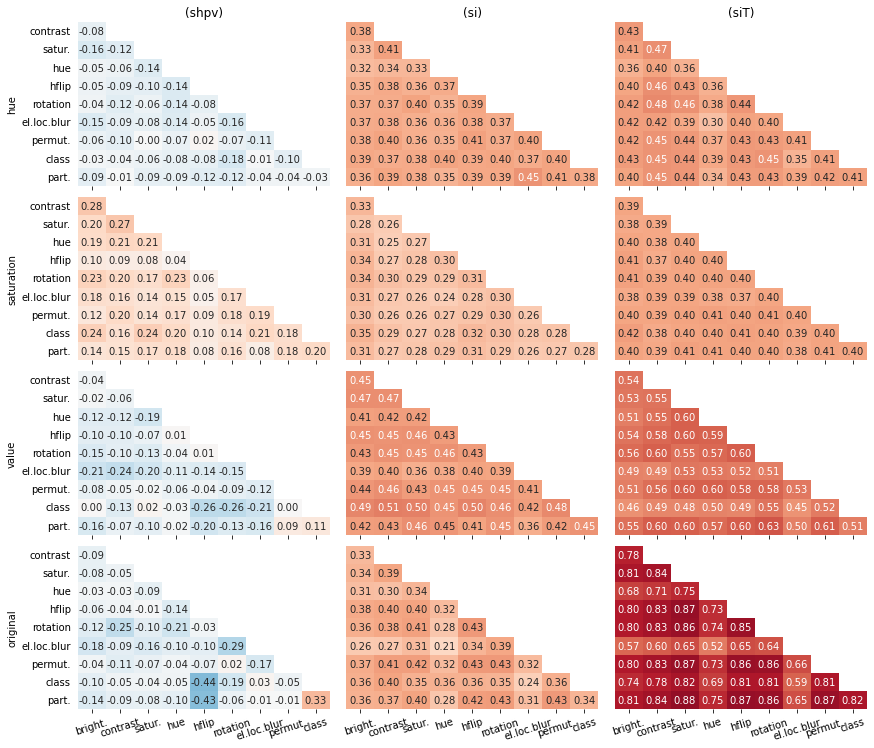


			layer1


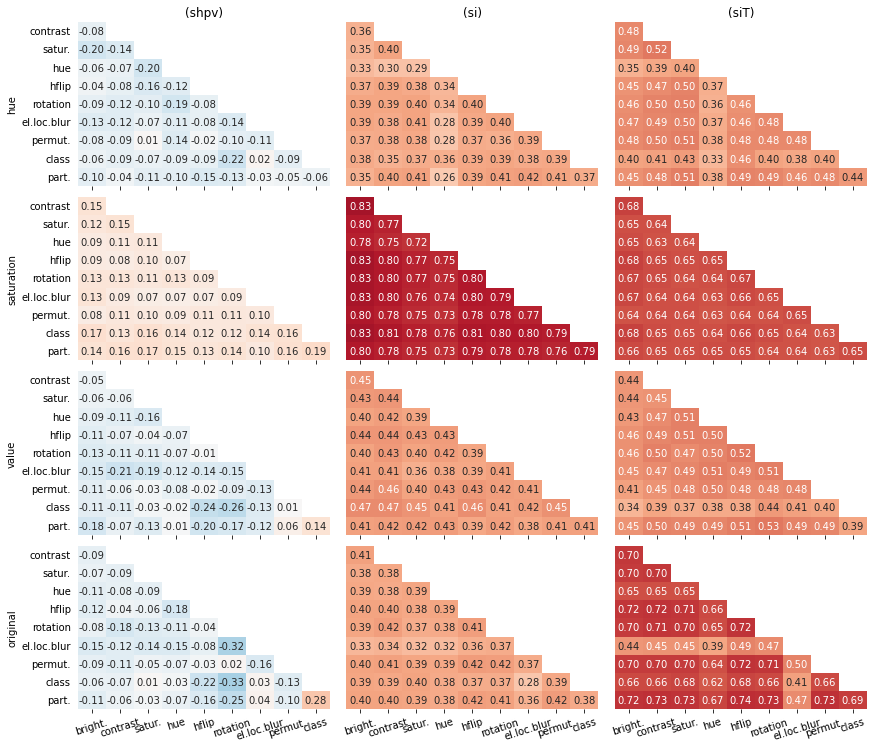


			layer2


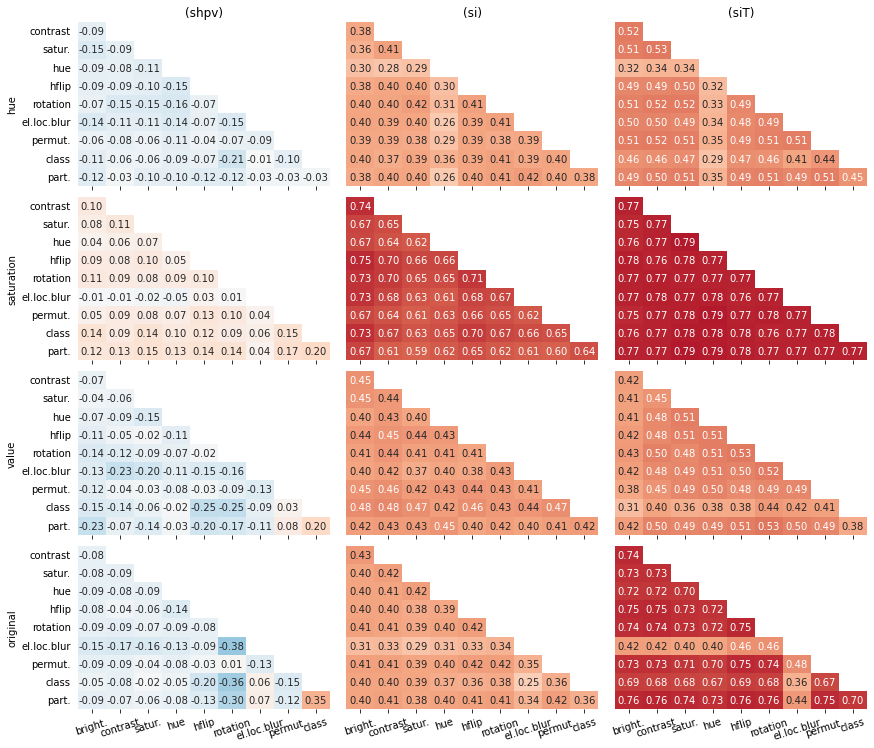


			layer3


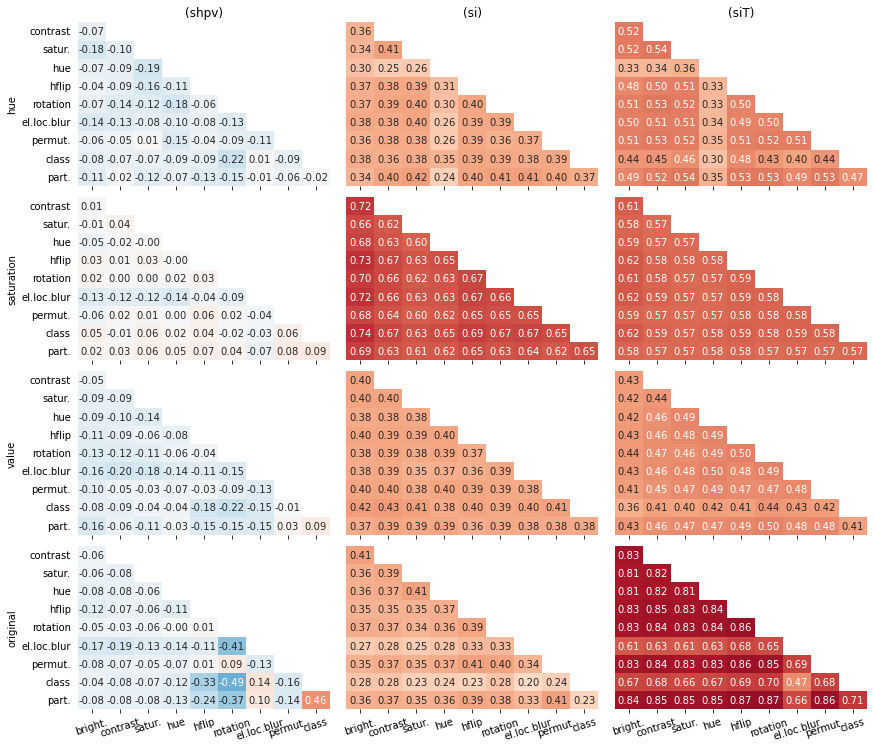

In [12]:
augmentation_set_number = 2

save_dirname = '../results/resnet18/unit_mean_pixelwise_corpat/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'unit_mean_pixelwise_corpat_aug={augmentation_set_number}'


correlation.su_visualize.unit_mean_pixelwise_correlation_patterns(
    resnet18_mean_cormat_hsv_dict[augmentation_set_number],
    resnet18_mean_cormat_orig_dict[augmentation_set_number],
    resnet18_network_modules,
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_cm,
    figsize=figsize_uw_means_cm_2,
    show=show,
    no_chan_name=no_chan_name,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

### 2.2.2 Histograms of the (unit-wise) standard deviations

- [2.2.2.1 Augmentation set 1](#2.2.2.1-Augmentation-set-1)
- [2.2.2.2 Augmentation set 2](#2.2.2.2-Augmentation-set-2)

[[Back to subsection]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 2.2.2.1 Augmentation set 1

[[Return back]](#2.2.2-Histograms-of-the-(unit-wise)-standard-deviations)


			maxpool



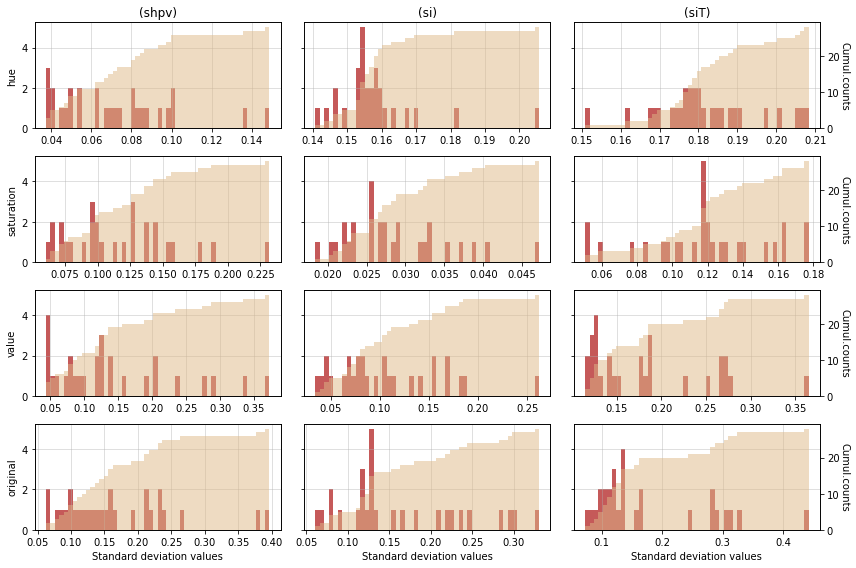


			layer1



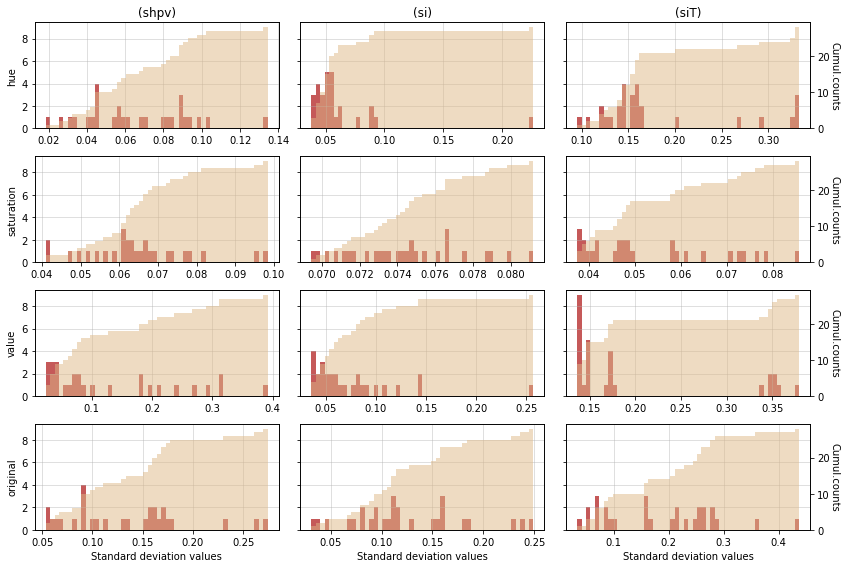


			layer2



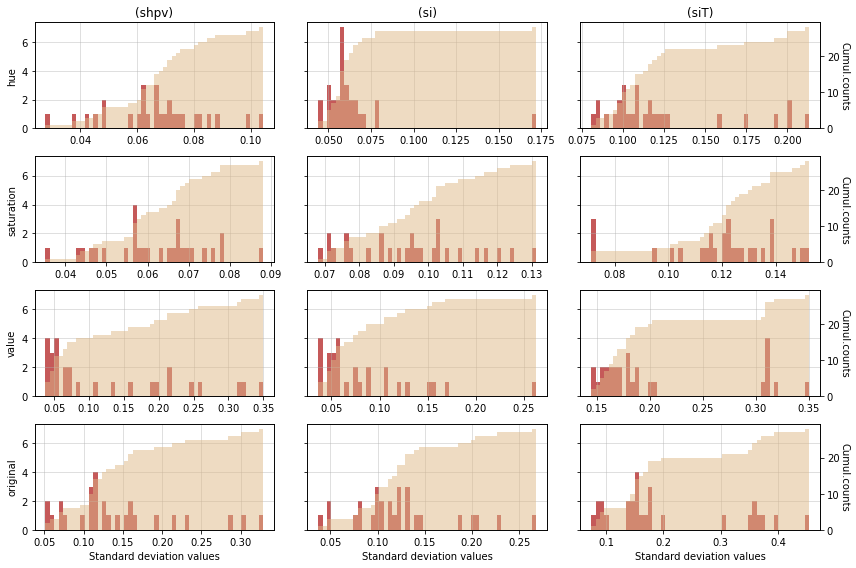


			layer3



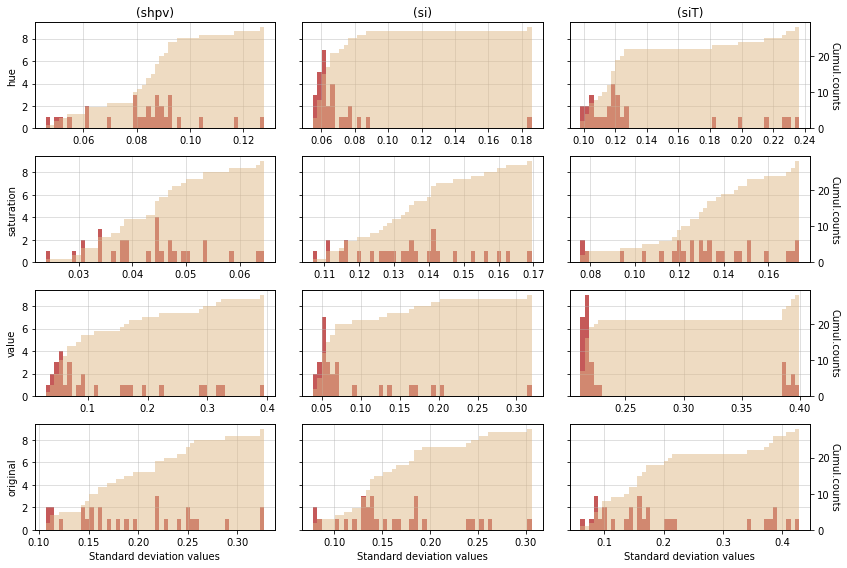

In [13]:
augmentation_set_number = 1

correlation.su_visualize.plot_hist_std_correlations_fixed_values(
    resnet18_std_cormat_hsv_dict[augmentation_set_number],
    resnet18_std_cormat_orig_dict[augmentation_set_number],
    augmentation_set_number,
    resnet18_network_modules,
    chans_name_list,
    value_name_list,
    n_conv_modules=resnet18_n_conv_modules,
    figsize=figsize_hist_uw_means_cm,
    show=show,
    color_cumul=color_cumul_uw_means_cm,
    color_bins=color_bins_uw_means_cm,
    no_chan_name=no_chan_name,
)

#### 2.2.2.2 Augmentation set 2

[[Return back]](#2.2.2-Histograms-of-the-(unit-wise)-standard-deviations)


			maxpool



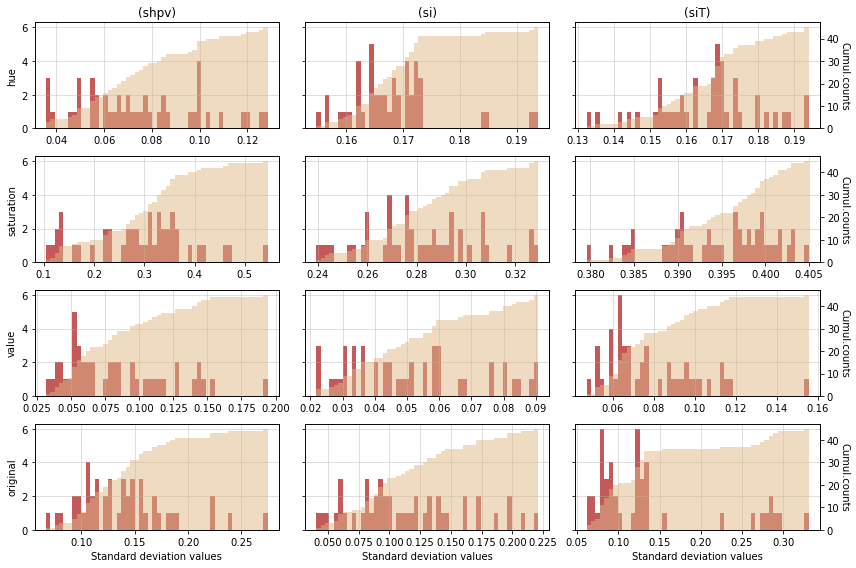


			layer1



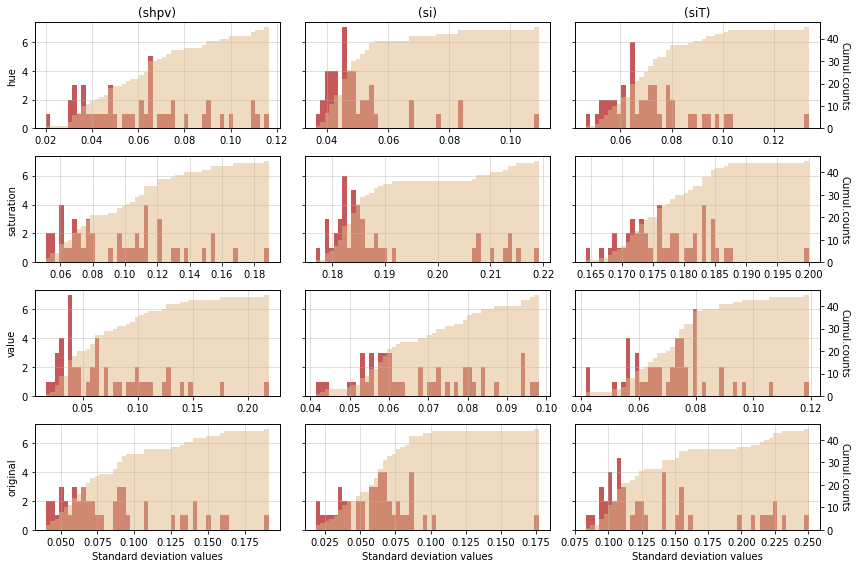


			layer2



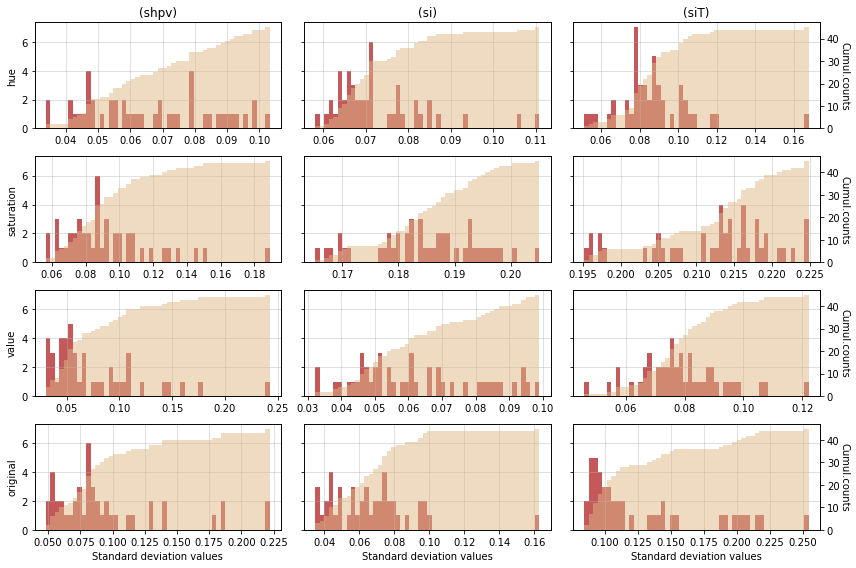


			layer3



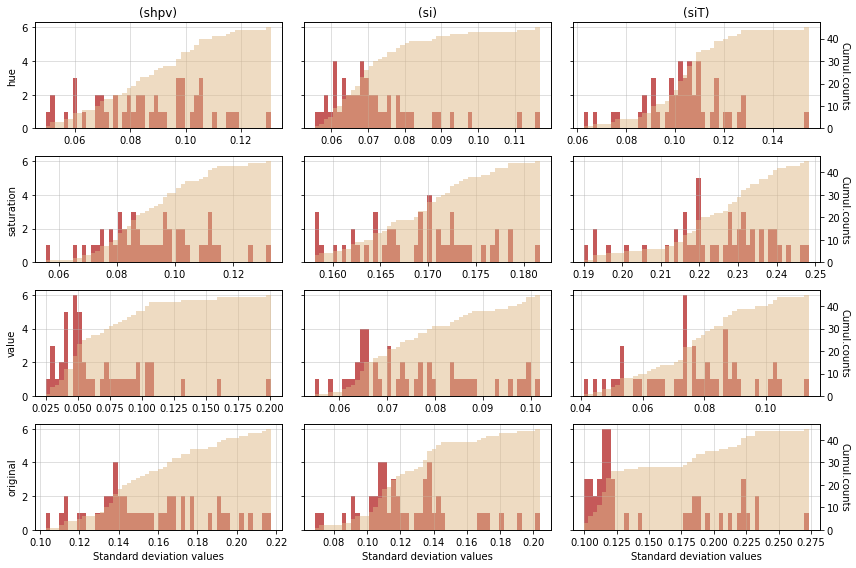

In [15]:
augmentation_set_number = 2

correlation.su_visualize.plot_hist_std_correlations_fixed_values(
    resnet18_std_cormat_hsv_dict[augmentation_set_number],
    resnet18_std_cormat_orig_dict[augmentation_set_number],
    augmentation_set_number,
    resnet18_network_modules,
    chans_name_list,
    value_name_list,
    n_conv_modules=resnet18_n_conv_modules,
    figsize=figsize_hist_uw_means_cm,
    show=show,
    color_cumul=color_cumul_uw_means_cm,
    color_bins=color_bins_uw_means_cm,
    no_chan_name=no_chan_name,
)

### 2.2.3 Consolidated summary plots

- [2.2.3.1 Augmentation set 1](#2.2.3.1-Augmentation-set-1)
- [2.2.3.2 Augmentation set 2](#2.2.3.2-Augmentation-set-2)

[[Back to subsection]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)

#### 2.2.3.1 Augmentation set 1

[[Return back]](#2.2.3-Consolidated-summary-plots)

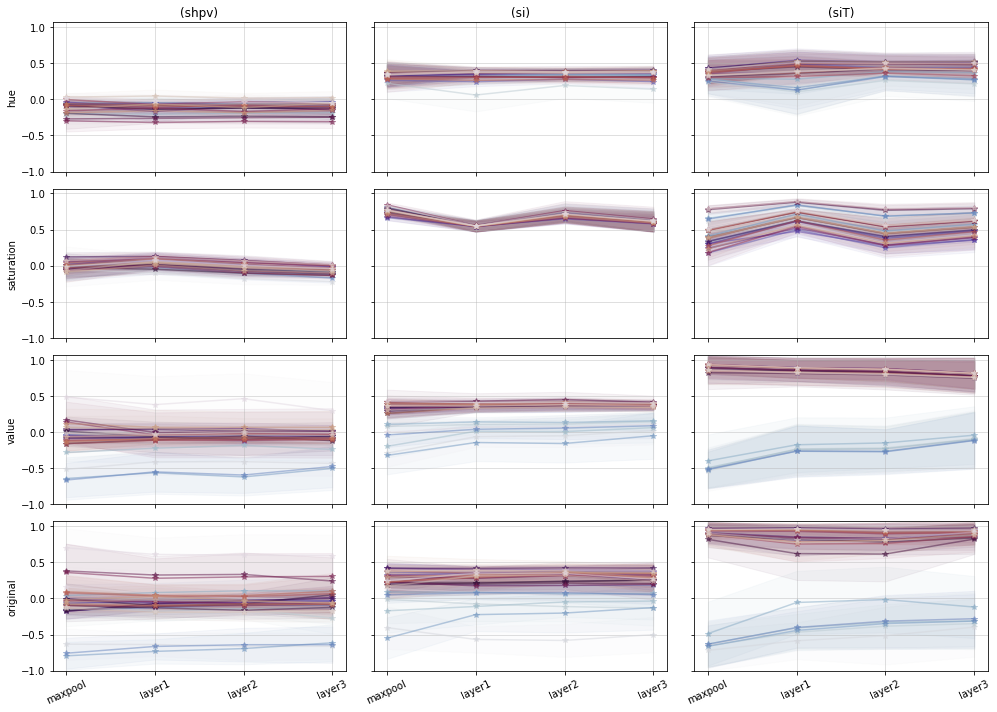

In [18]:
augmentation_set_number = 1

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_mean_cormat_hsv_dict[augmentation_set_number],
    resnet18_std_cormat_hsv_dict[augmentation_set_number],
    resnet18_mean_cormat_orig_dict[augmentation_set_number],
    resnet18_std_cormat_orig_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_corr_consolidated,
    show=show,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
)

#### 2.2.3.2 Augmentation set 2

[[Return back]](#2.2.3-Consolidated-summary-plots)

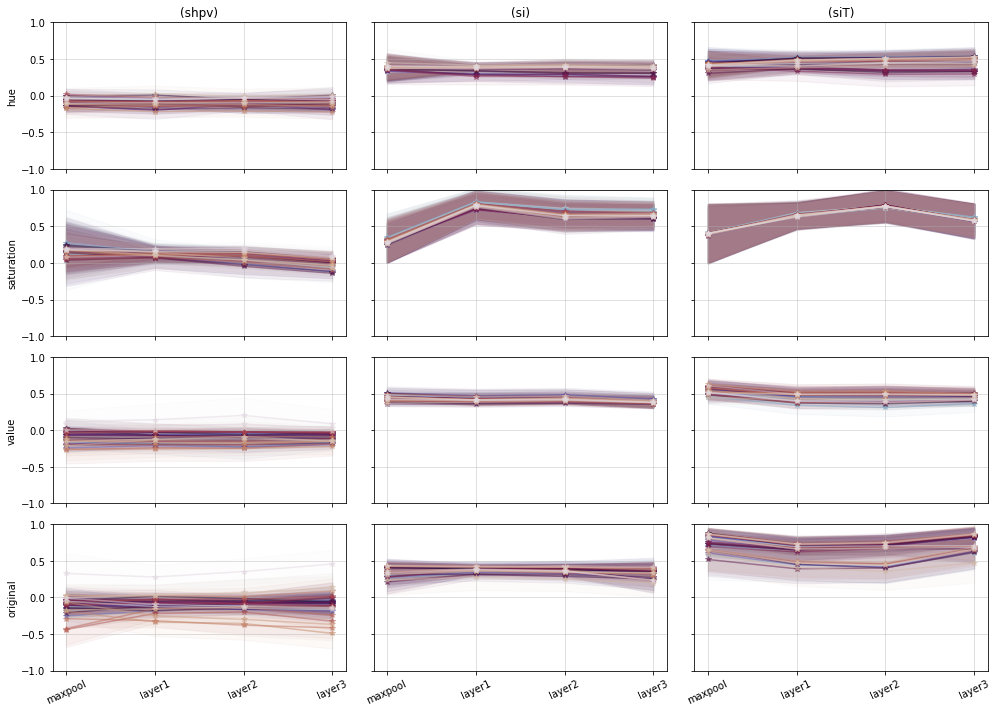

In [19]:
augmentation_set_number = 2

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_mean_cormat_hsv_dict[augmentation_set_number],
    resnet18_std_cormat_hsv_dict[augmentation_set_number],
    resnet18_mean_cormat_orig_dict[augmentation_set_number],
    resnet18_std_cormat_orig_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_corr_consolidated,
    show=show,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
)

### 2.3 Mean absolute differences between (space-wise) correlation matrices (original and cut submodule)

[[$\leftarrow$Prev.subsect.]](#2.2-Correlation-(space-wise)-between-pairs-of-augmentation-variables)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

- [2.3.1 Unit-wise means](#2.3.1-Unit-wise-means)
- [2.3.2 Histograms of the (unit-wise) standard deviations](#2.3.2-Histograms-of-the-(unit-wise)-standard-deviations)
- [2.3.3 Consolidated summary plots](#2.3.3-Consolidated-summary-plots)

### 2.3.1 Unit-wise means

- [2.3.1.1 Augmentation set 1](#2.3.1.2-Augmentation-set-1)
- [2.3.1.2 Augmentation set 2](#2.3.1.2-Augmentation-set-2)

[[Back to subsection]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 2.3.1.1 Augmentation set 1

[[Return back]](#2.3.1-Unit-wise-means)


			maxpool


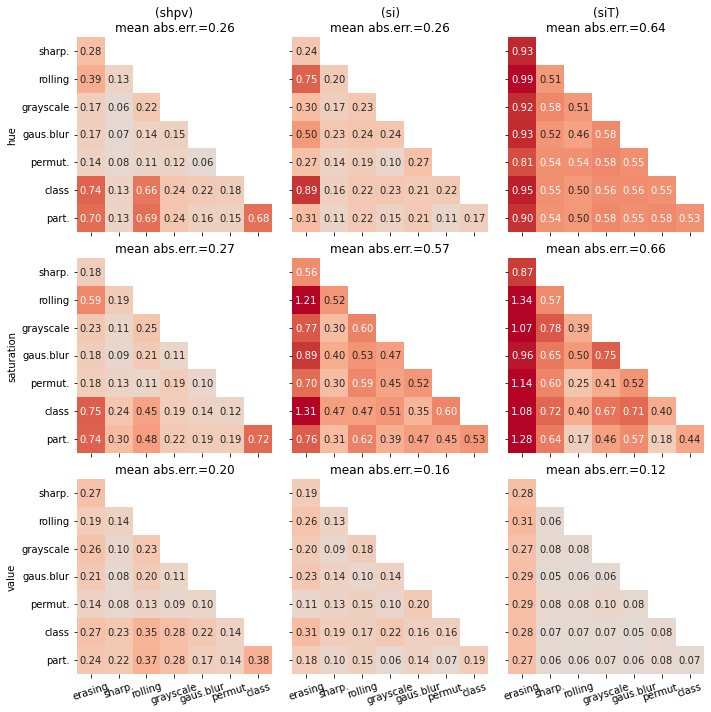


			layer1


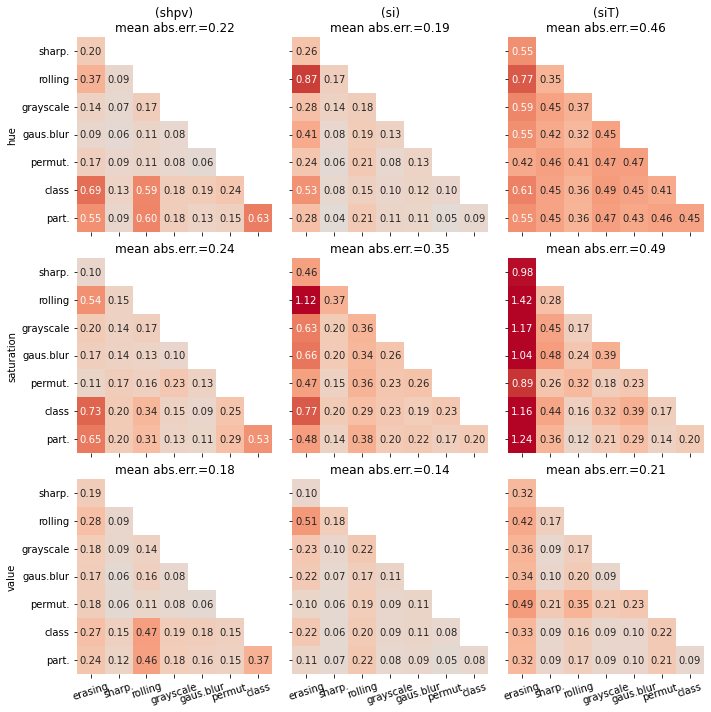


			layer2


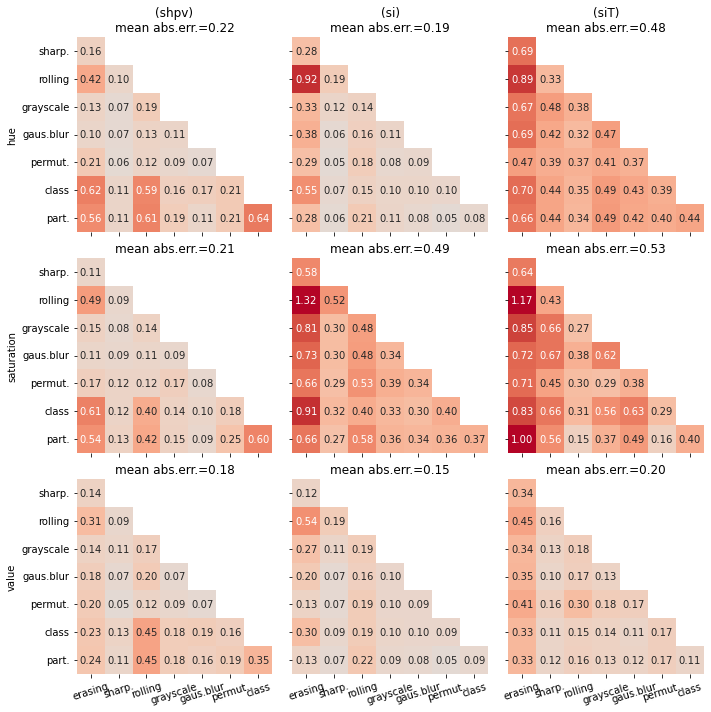


			layer3


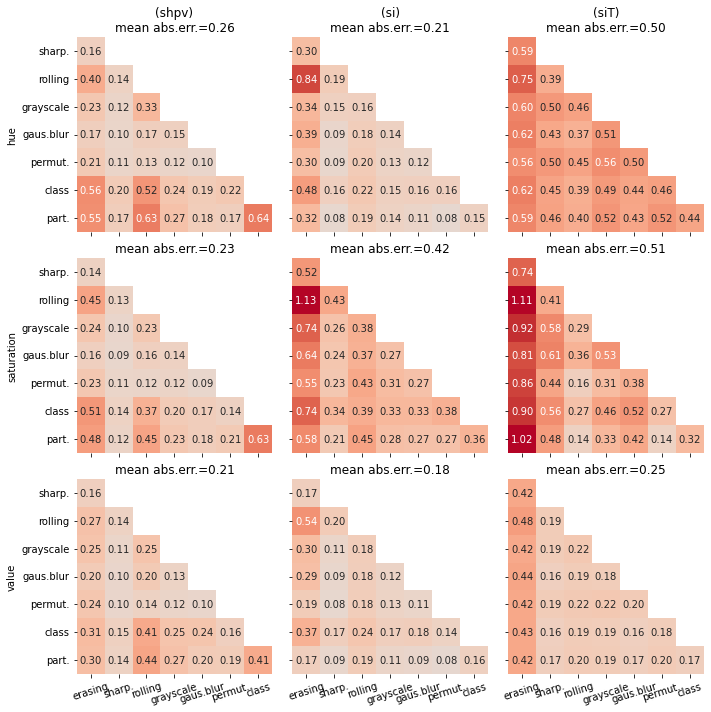

In [20]:
augmentation_set_number = 1

correlation.su_visualize.unit_mean_pixelwise_diff_correlation_patterns(
    resnet18_mean_cormat_diff[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_diff_cm,
    figsize=figsize_uw_means_diff_cm_1,
    show=show,
)

#### 2.3.1.2 Augmentation set 2

[[Return back]](#2.3.1-Unit-wise-means)


			maxpool


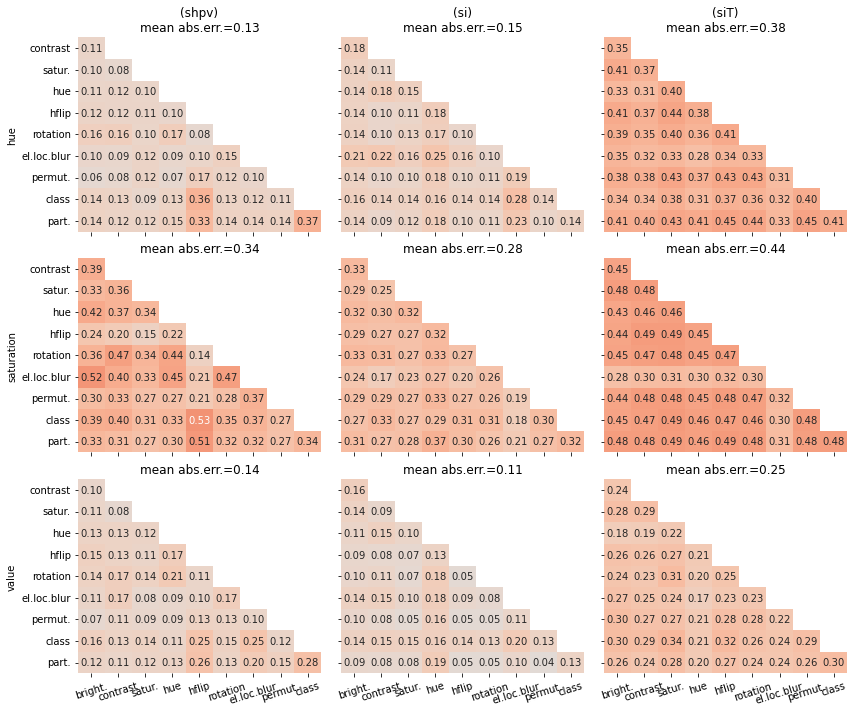


			layer1


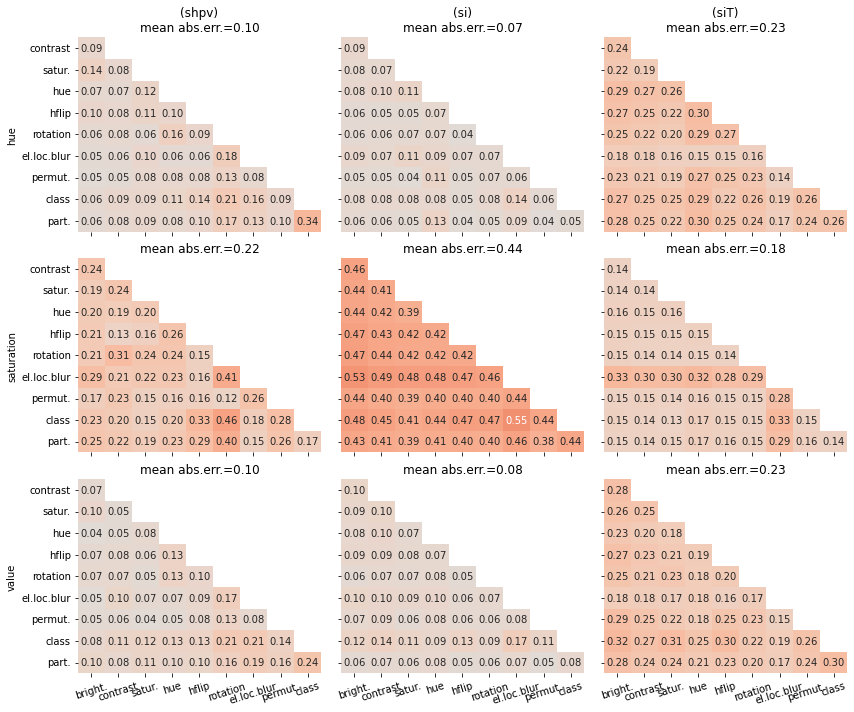


			layer2


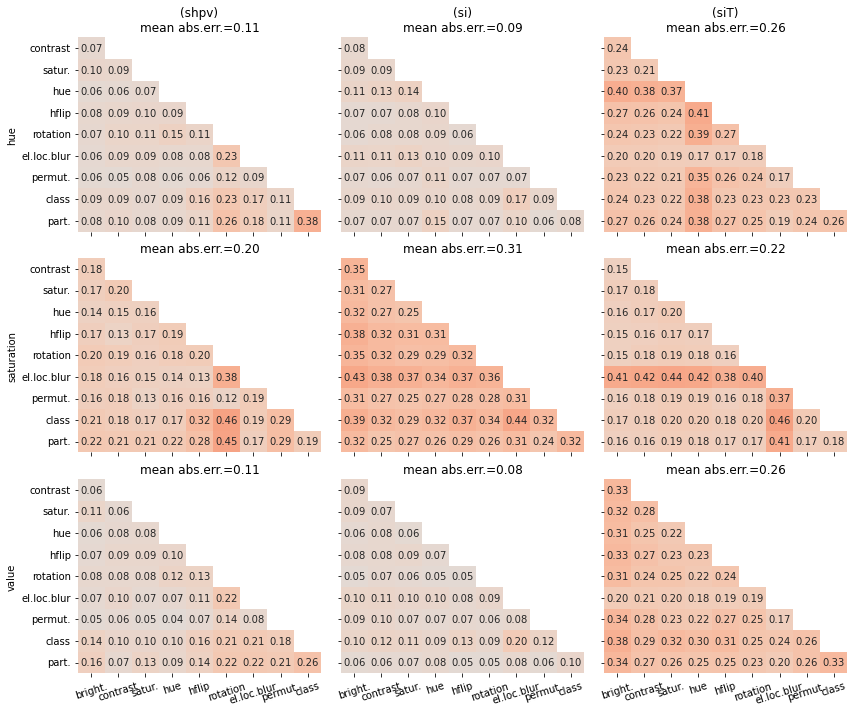


			layer3


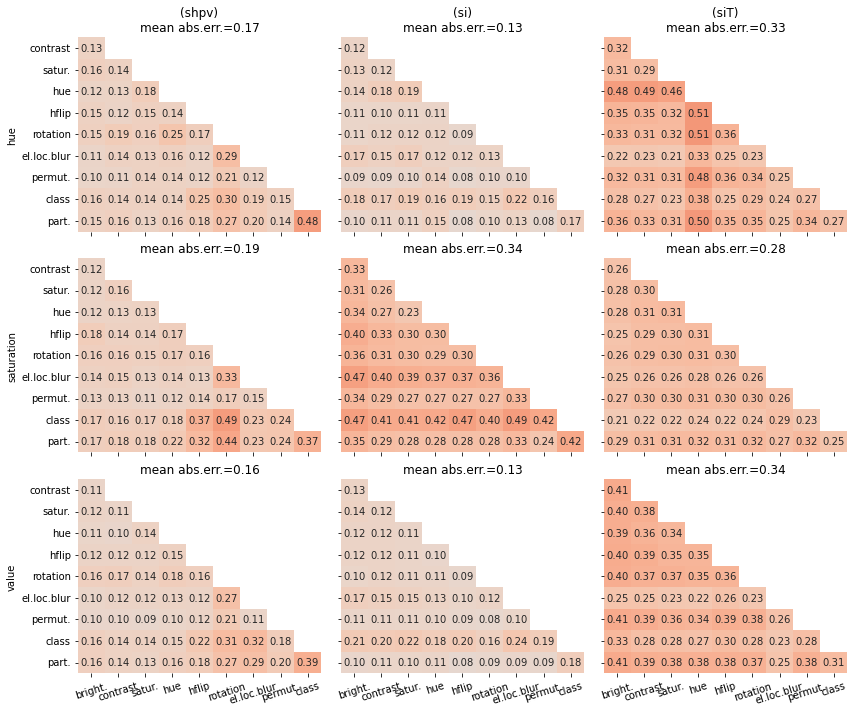

In [21]:
augmentation_set_number = 2

correlation.su_visualize.unit_mean_pixelwise_diff_correlation_patterns(
    resnet18_mean_cormat_diff[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    augmentation_set_number,
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    cmap=cmap_uw_means_diff_cm,
    figsize=figsize_uw_means_diff_cm_2,
    show=show,
)

### 2.3.2 Histograms of the (unit-wise) standard deviations

- [2.3.2.1 Augmentation set 1](#2.3.2.1-Augmentation-set-1)
- [2.3.2.2 Augmentation set 2](#2.3.2.2-Augmentation-set-2)

[[Back to subsection]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 2.3.2.1 Augmentation set 1

[[Return back]](#2.3.2-Histograms-of-the-(unit-wise)-standard-deviations)


			maxpool



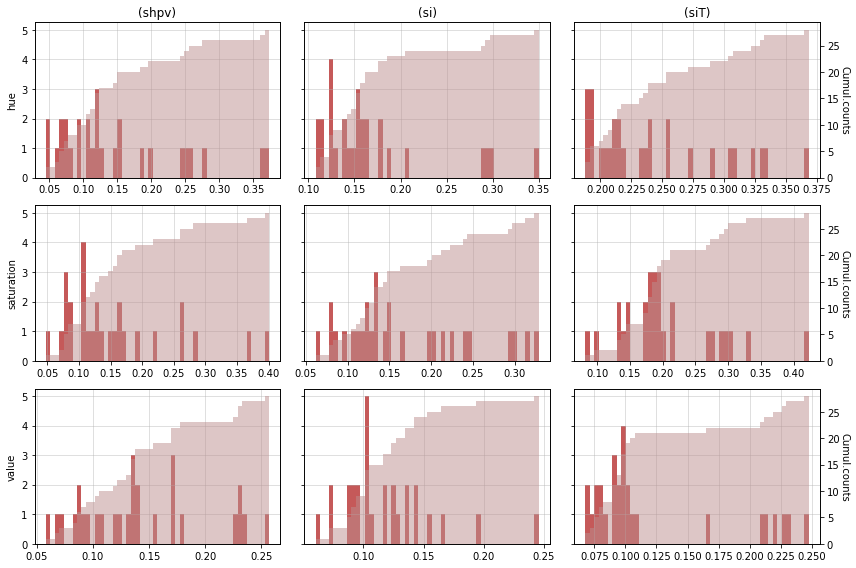


			layer1



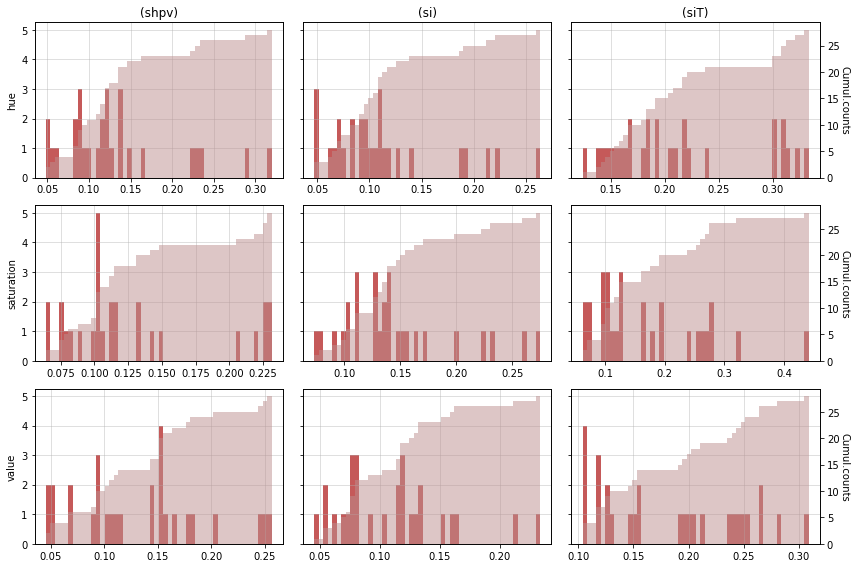


			layer2



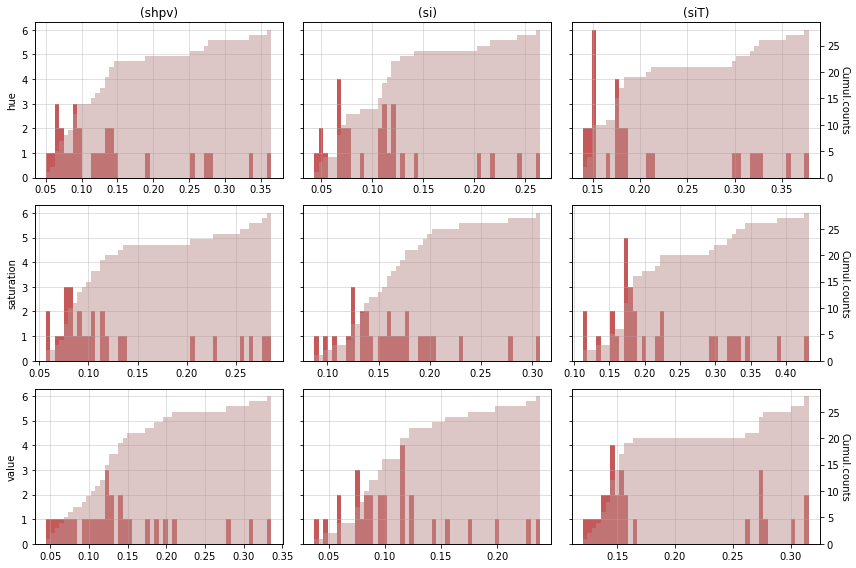


			layer3



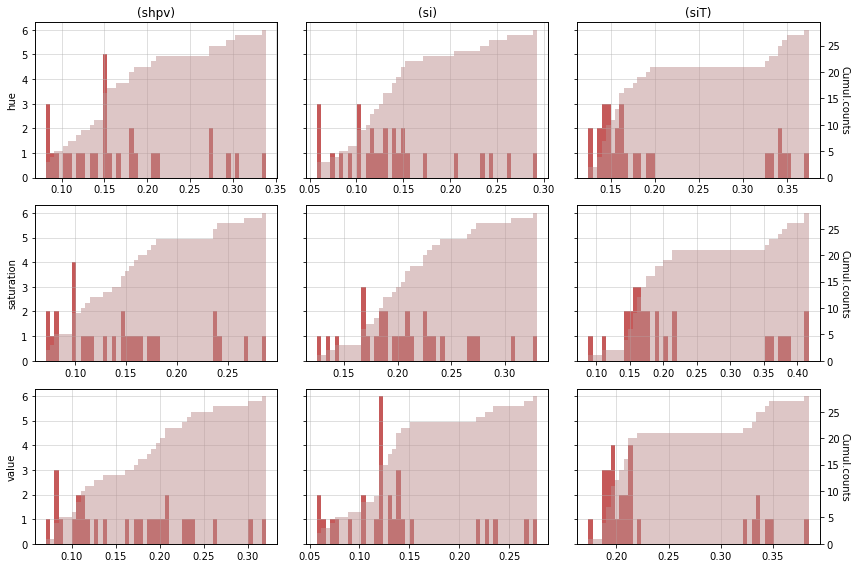

In [22]:
augmentation_set_number = 1

correlation.su_visualize.plot_hist_std_correlations_fixed_values(
    resnet18_std_cormat_diff[augmentation_set_number],
    None,
    augmentation_set_number,
    resnet18_network_modules,
    chans_name_list,
    value_name_list,
    n_conv_modules=resnet18_n_conv_modules,
    figsize=figsize_hist_uw_means_diff_cm,
    show=show,
    color_cumul=color_cumul_uw_means_diff_cm,
    color_bins=color_bins_uw_means_diff_cm,
    no_chan_name=no_chan_name,
)

#### 2.3.2.2 Augmentation set 2

[[Return back]](#2.3.2-Histograms-of-the-(unit-wise)-standard-deviations)


			maxpool



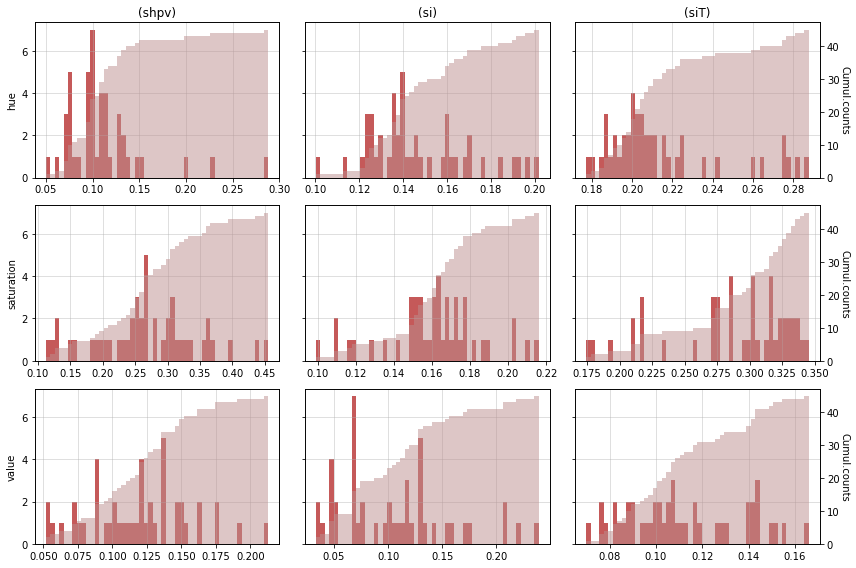


			layer1



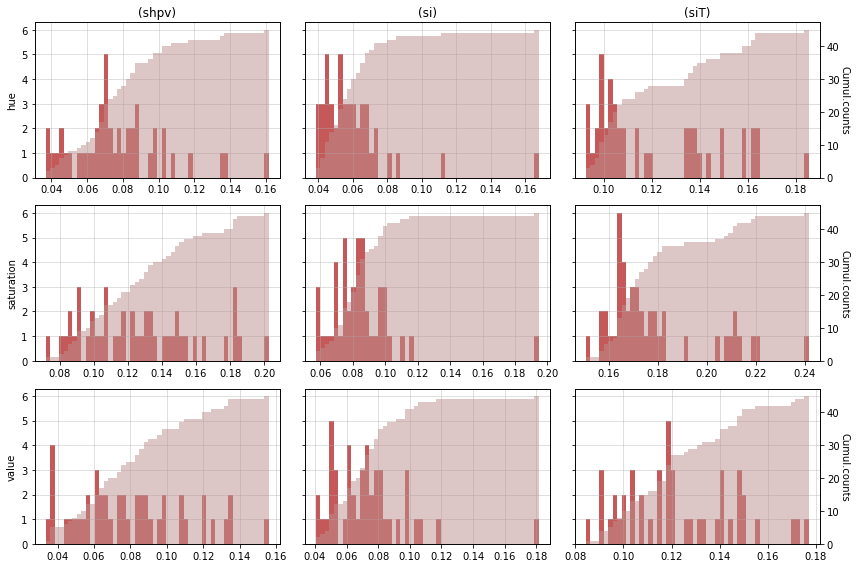


			layer2



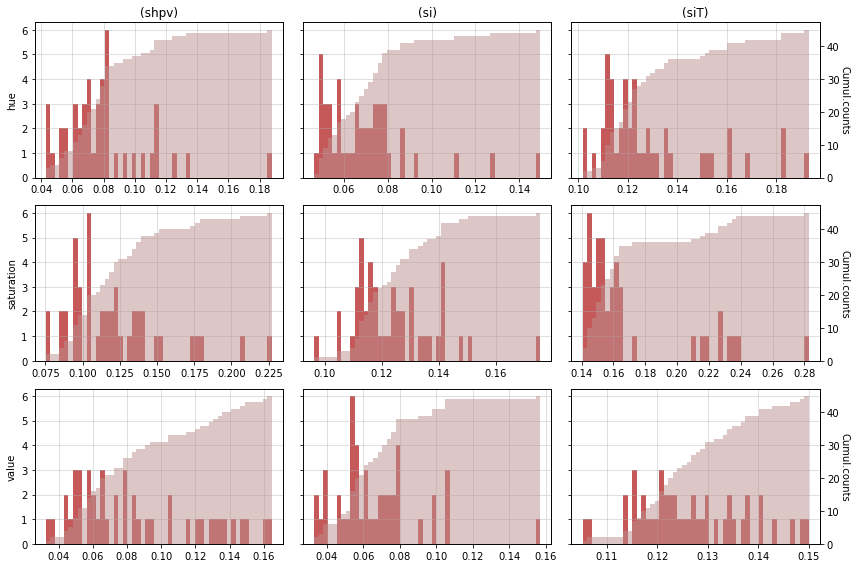


			layer3



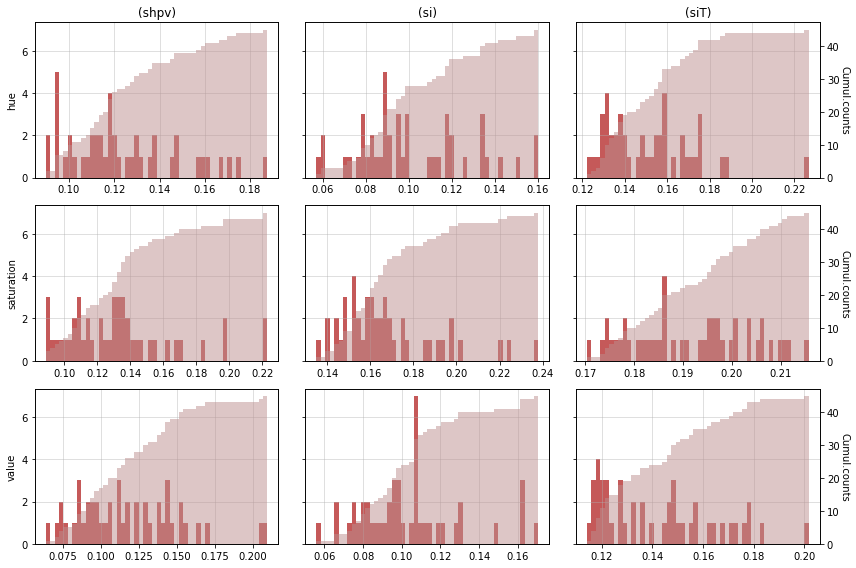

In [23]:
augmentation_set_number = 2

correlation.su_visualize.plot_hist_std_correlations_fixed_values(
    resnet18_std_cormat_diff[augmentation_set_number],
    None,
    augmentation_set_number,
    resnet18_network_modules,
    chans_name_list,
    value_name_list,
    n_conv_modules=resnet18_n_conv_modules,
    figsize=figsize_hist_uw_means_diff_cm,
    show=show,
    color_cumul=color_cumul_uw_means_diff_cm,
    color_bins=color_bins_uw_means_diff_cm,
    no_chan_name=no_chan_name,
)

### 2.3.3 Consolidated summary plots

- [2.3.3.1 Augmentation set 1](#2.3.3.1-Augmentation-set-1)
- [2.3.3.2 Augmentation set 2](#2.3.3.2-Augmentation-set-2)

[[Back to subsection]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))

#### 2.3.3.1 Augmentation set 1

[[Return back]](#2.3.3-Consolidated-summary-plots)

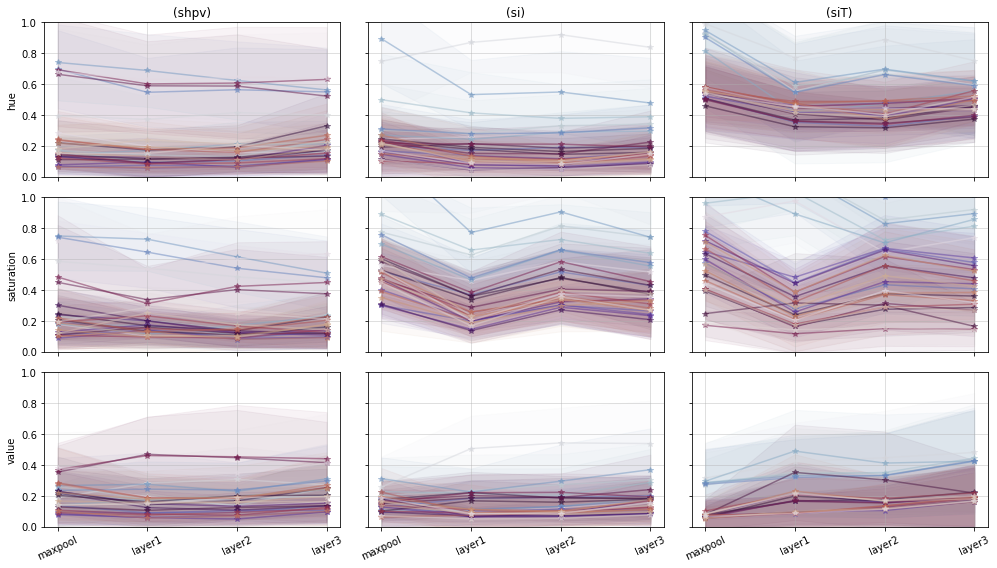

In [24]:
augmentation_set_number = 1

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_mean_cormat_diff[augmentation_set_number],
    resnet18_std_cormat_diff[augmentation_set_number],
    None,
    None,
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_corr_consolidated_diff,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
    vmin=0,
)

#### 2.3.3.2 Augmentation set 2

[[Return back]](#2.3.3-Consolidated-summary-plots)

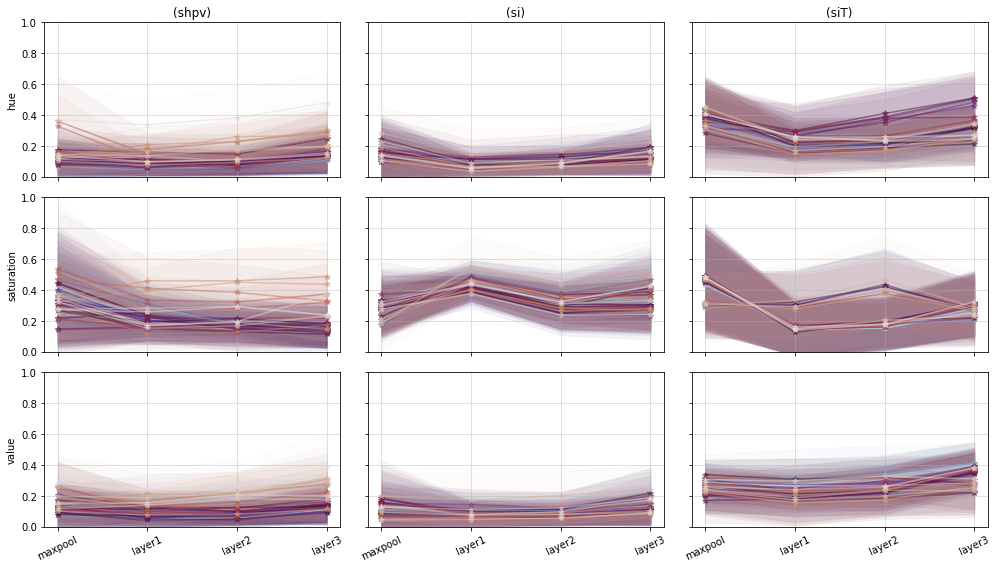

In [25]:
augmentation_set_number = 2

correlation.su_visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_mean_cormat_diff[augmentation_set_number],
    resnet18_std_cormat_diff[augmentation_set_number],
    None,
    None,
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_corr_consolidated_diff,
    cmap=cmap_corr_consolidated,
    no_chan_name=no_chan_name,
    vmin=0,
)

### 2.4 Mean absolute norm between (space-wise) correlation matrices for pairs of layers

[[$\leftarrow$Prev.subsect.]](#2.3-Mean-absolute-differences-between-(space-wise)-correlation-matrices-(original-and-cut-submodule))$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.5-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

- [2.4.1 Unit-wise means](#2.4.1-Unit-wise-means)
- [2.4.2 Histograms of the (unit-wise) standard deviations](#2.4.2-Histograms-of-the-(unit-wise)-standard-deviations)

### 2.4.1 Unit-wise means

- [2.4.1.1 Augmentation set 1](#2.4.1.2-Augmentation-set-1)
- [2.4.1.2 Augmentation set 2](#2.4.1.2-Augmentation-set-2)

[[Back to subsection]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

#### 2.4.1.1 Augmentation set 1

[[Return back]](#2.4.1-Unit-wise-means)

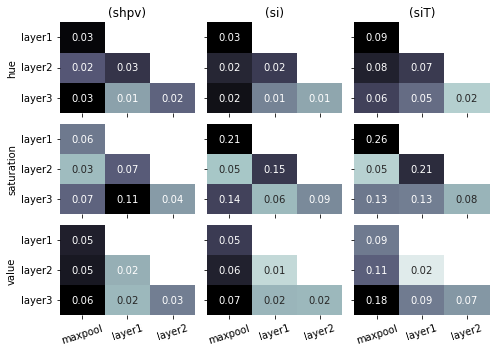

In [26]:
augmentation_set_number = 1

save_dirname = '../results/resnet18/hsv_diff_patterns_among_checkpoints/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_among_chkpts'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_mean_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap=cmap_unit_cm_patterns,
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
)

#### 2.4.1.2 Augmentation set 2

[[Return back]](#2.4.1-Unit-wise-means)

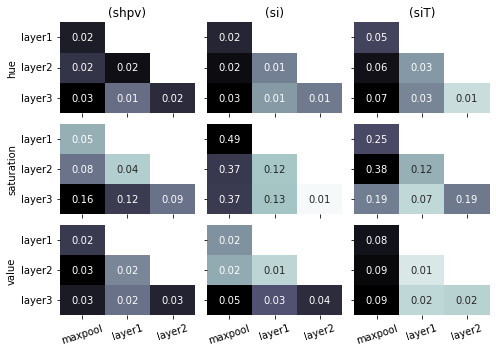

In [27]:
augmentation_set_number = 2

save_dirname = '../results/resnet18/hsv_diff_patterns_among_checkpoints/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_among_chkpts'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_mean_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    cmap=cmap_unit_cm_patterns,
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
)

### 2.4.2 Histograms of the (unit-wise) standard deviations

- [2.4.2.1 Augmentation set 1](#2.4.2.2-Augmentation-set-1)
- [2.4.2.2 Augmentation set 2](#2.4.2.2-Augmentation-set-2)

[[Back to subsection]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)

#### 2.4.2.1 Augmentation set 1

[[Return back]](#2.4.2-Histograms-of-the-(unit-wise)-standard-deviations)

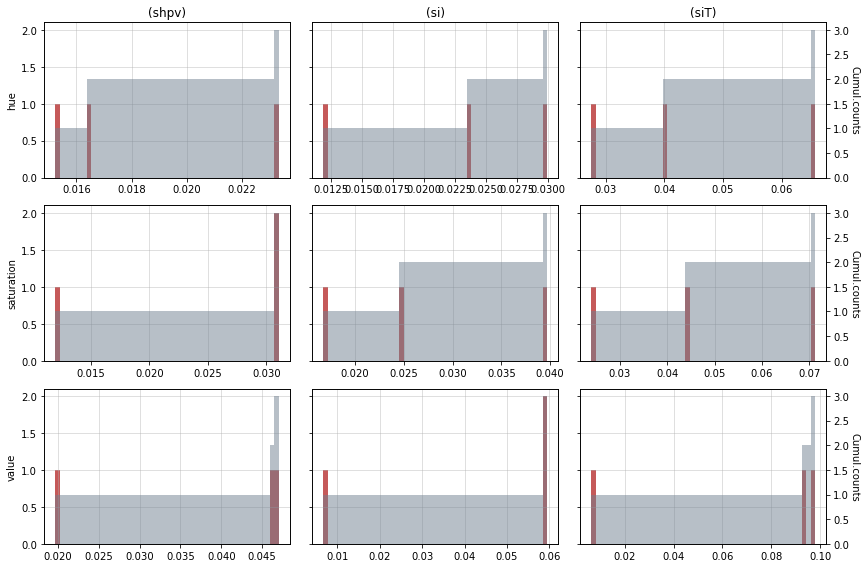

In [28]:
augmentation_set_number = 1

correlation.su_visualize.plot_hist_std_correlations_fixed_values_cross_layers(
    resnet18_cm_std_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_hist_uw_means_diff_cm_norm,
    color_cumul=color_cumul_hist_uw_means_diff_cm_norm,
    color_bins=color_bins_hist_uw_means_diff_cm_norm,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
)

#### 2.4.2.2 Augmentation set 2

[[Return back]](#2.4.2-Histograms-of-the-(unit-wise)-standard-deviations)

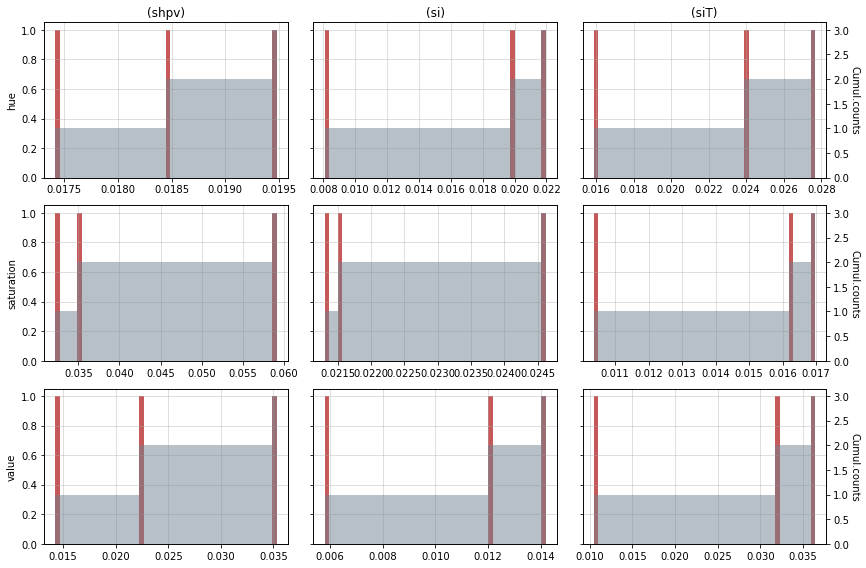

In [29]:
augmentation_set_number = 2

correlation.su_visualize.plot_hist_std_correlations_fixed_values_cross_layers(
    resnet18_cm_std_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    show=show,
    figsize=figsize_hist_uw_means_diff_cm_norm,
    color_cumul=color_cumul_hist_uw_means_diff_cm_norm,
    color_bins=color_bins_hist_uw_means_diff_cm_norm,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
)

### 2.5 Correlation patterns extracted from correlation matrices for paired layers

[[$\leftarrow$Prev.subsect.]](#2.4-Mean-absolute-norm-between-(space-wise)-correlation-matrices-for-pairs-of-layers)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

- [2.5.1 Augmentation set 1](#2.5.1-Augmentation-set-1)
- [2.5.2 Augmentation set 2](#2.5.2-Augmentation-set-2)

#### 2.5.1 Augmentation set 1

[[Back to subsection]](#2.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

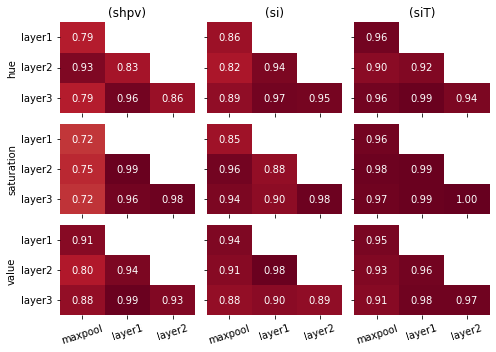

In [30]:
augmentation_set_number = 1

save_dirname = '../results/resnet18/hsv_diff_patterns_among_checkpoints_corr/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_among_chkpts_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_corr_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    #cmap='Spectral_r',
    cmap='RdGy_r',
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    cmap_bounds=(-1, 1),
    cormat_nanmask=resnet18_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number],
)

#### 2.5.2 Augmentation set 2

[[Back to subsection]](#2.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)

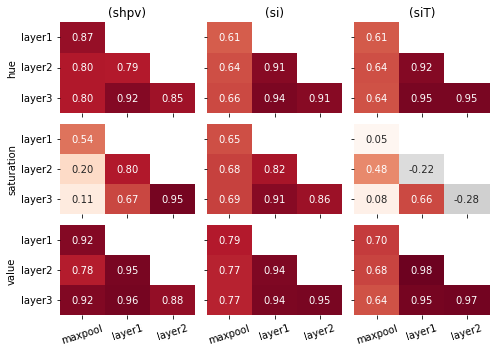

In [31]:
augmentation_set_number = 2

save_dirname = '../results/resnet18/hsv_diff_patterns_among_checkpoints_corr/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_among_chkpts_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_corr_hsv_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=False,
    triangular=True,
    #cmap='Spectral_r',
    cmap='RdGy_r',
    figsize=figsize_unit_cm_patterns,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    cmap_bounds=(-1, 1),
    cormat_nanmask=resnet18_cm_corr_hsv_diff_nanmask_dict[augmentation_set_number],
)

### 2.6 Mean absolute norm between (space-wise) original-channel differences of correlation matrices for pairs of layers

[[$\leftarrow$Prev.subsect.]](#2.5-Correlation-patterns-extracted-from-correlation-matrices-for-paired-layers)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

- [2.6.1 Unit-wise means](#2.6.1-Unit-wise-means)
- [2.6.2 Histograms of the (unit-wise) standard deviations](#2.6.2-Histograms-of-the-(unit-wise)-standard-deviations)

### 2.6.1 Unit-wise means

- [2.6.1.1 Augmentation set 1](#2.6.1.2-Augmentation-set-1)
- [2.6.1.2 Augmentation set 2](#2.6.1.2-Augmentation-set-2)

[[Back to subsection]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

#### 2.6.1.1 Augmentation set 1

[[Return back]](#2.6.1-Unit-wise-means)

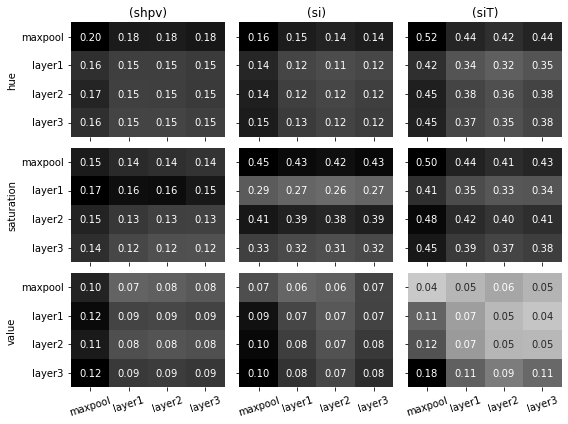

In [32]:
augmentation_set_number = 1

save_dirname = '../results/resnet18/hsv_diff_patterns_with_orig/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_with_orig'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_mean_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap=cmap_uw_means_diff_cm_norm_orig_chan,
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
)

#### 2.6.1.2 Augmentation set 2

[[Return back]](#2.6.1-Unit-wise-means)

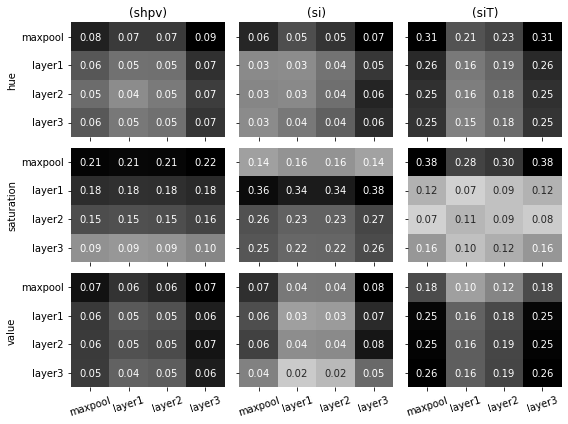

In [33]:
augmentation_set_number = 2

save_dirname = '../results/resnet18/hsv_diff_patterns_with_orig/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_with_orig'

correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_mean_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap=cmap_uw_means_diff_cm_norm_orig_chan,
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
)

### 2.6.2 Histograms of the (unit-wise) standard deviations

- [2.6.2.1 Augmentation set 1](#2.6.2.2-Augmentation-set-1)
- [2.6.2.2 Augmentation set 2](#2.6.2.2-Augmentation-set-2)

[[Back to subsection]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)

#### 2.6.2.1 Augmentation set 1

[[Return back]](#2.6.2-Histograms-of-the-(unit-wise)-standard-deviations)

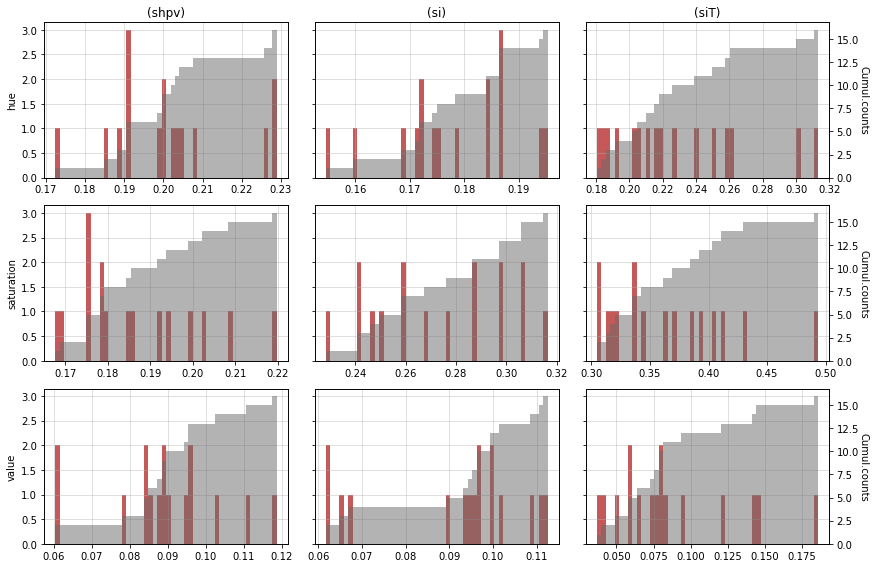

In [34]:
augmentation_set_number = 1

correlation.su_visualize.plot_hist_std_correlations_fixed_values_cross_layers(
    resnet18_cm_std_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_hist_uw_means_diff_cm_norm_orig_chan,
    show=show,
    color_cumul=color_cumul_hist_uw_means_diff_cm_norm_orig_chan,
    color_bins=color_bins_hist_uw_means_diff_cm_norm_orig_chan,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
)

#### 2.6.2.2 Augmentation set 2

[[Return back]](#2.6.2-Histograms-of-the-(unit-wise)-standard-deviations)

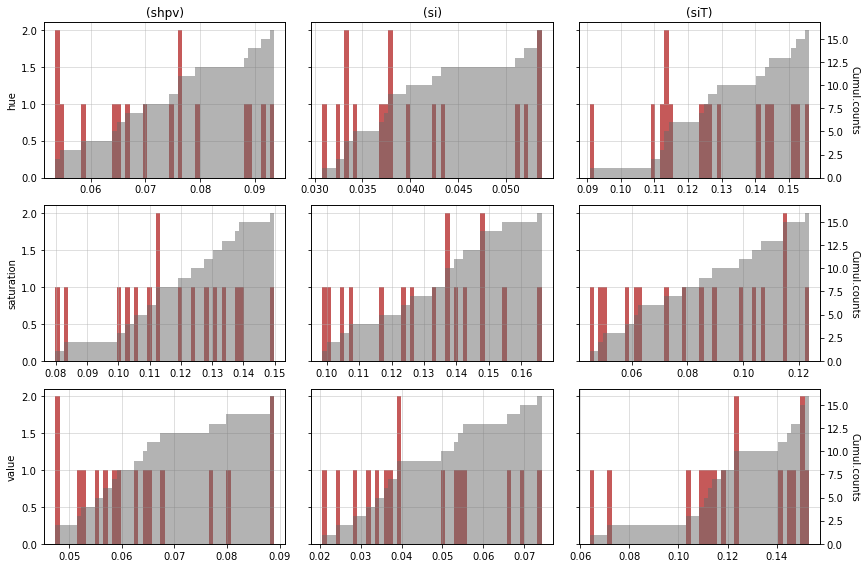

In [35]:
augmentation_set_number = 2

correlation.su_visualize.plot_hist_std_correlations_fixed_values_cross_layers(
    resnet18_cm_std_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    figsize=figsize_hist_uw_means_diff_cm_norm_orig_chan,
    show=show,
    color_cumul=color_cumul_hist_uw_means_diff_cm_norm_orig_chan,
    color_bins=color_bins_hist_uw_means_diff_cm_norm_orig_chan,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
)

### 2.7 Correlation patterns extracted from original-channel correlation matrices for paired layers

[[$\leftarrow$Prev.subsect.]](#2.6-Mean-absolute-norm-between-(space-wise)-original-channel-differences-of-correlation-matrices-for-pairs-of-layers)$\quad$[[Back to section]](#2.-ResNet18)$\quad$

- [2.7.1 Augmentation set 1](#2.7.1-Augmentation-set-1)
- [2.7.2 Augmentation set 2](#2.7.2-Augmentation-set-2)

#### 2.7.1 Augmentation set 1


[[Back to subsection]](#2.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

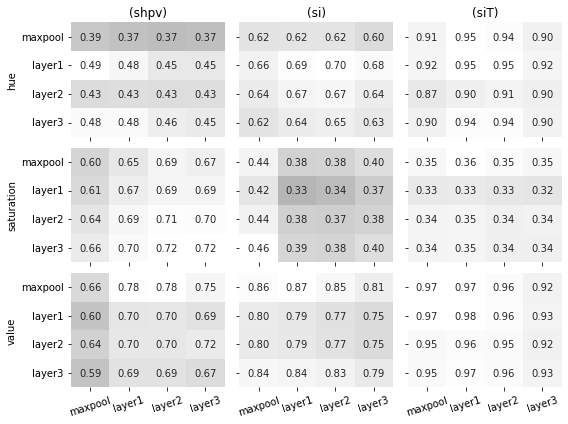

In [36]:
augmentation_set_number = 1

save_dirname = '../results/resnet18/hsv_diff_patterns_with_orig_corr/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_with_orig_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_corr_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap='gist_yarg_r',
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(-1, 1),
    cormat_nanmask=resnet18_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number],
)

#### 2.7.2 Augmentation set 2


[[Back to subsection]](#2.7-Correlation-patterns-extracted-from-original-channel-correlation-matrices-for-paired-layers)

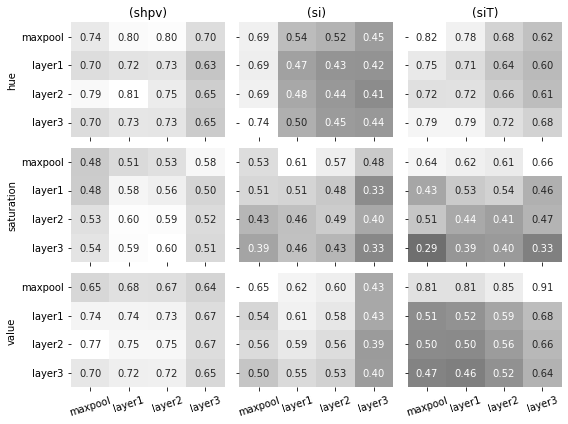

In [37]:
augmentation_set_number = 2

save_dirname = '../results/resnet18/hsv_diff_patterns_with_orig_corr/'
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'resnet18_hsv_diff_patterns_with_orig_corr'


correlation.su_visualize.hsv_correlation_diff_patterns_among_units(
    resnet18_cm_corr_hsv_orig_diff_dict[augmentation_set_number],
    resnet18_network_modules[:resnet18_n_conv_modules],
    chans_name_list,
    value_name_list,
    extract_auxilliary_names=extract_auxilliary_names,
    use_diag=True,
    triangular=False,
    cmap='gist_yarg_r',
    figsize=figsize_uw_means_diff_cm_norm_orig_chan,
    show=show,
    save_path=os.path.join(
        save_dirname,
        f'{save_filename_base}_augset={augmentation_set_number}.pdf'
    ),
    #cmap_bounds=(-1, 1),
    cormat_nanmask=resnet18_cm_corr_hsv_orig_diff_nanmask_dict[augmentation_set_number],
)